In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
import datetime as dt

In [4]:
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

In [5]:
# Load the dataset
file_path = r'C:\Users\AX2B\Desktop\apple_tp\apple_forcasting\World-Stock-Prices-Dataset.csv'  # Update with your file path
data = pd.read_csv(file_path)

In [6]:
# defining the time periode of our study
start_date = '2018-09-15'
end_date = '2023-09-03'

In [7]:
def isolate_column(data, brand_name, column_name):
    """
    Process stock data for a given brand and column, and calculate weekly means.

    Parameters:
    data (DataFrame): The DataFrame containing stock information.
    brand_name (str): The brand name to filter the data.
    column_name (str): The name of the column to analyze.
    start_date (str): The start date for the analysis in 'YYYY-MM-DD' format.
    end_date (str): The end date for the analysis in 'YYYY-MM-DD' format.

    Returns:
    DataFrame: A DataFrame with processed data.
    """
    # Filter data for the specified brand
    brand_df = data[data['Brand_Name'].str.lower() == brand_name.lower()]

    # Select only the specified column and the 'Date' column
    selected_df = brand_df[['Date', column_name]]

    # Convert 'Date' to datetime and sort by 'Date'
    selected_df['Date'] = pd.to_datetime(selected_df['Date'].str.split(" ").str[0])
    selected_df.sort_values('Date', inplace=True)

    # Set 'Date' as index and remove duplicates
    selected_df.set_index('Date', inplace=True)
    selected_df = selected_df[~selected_df.index.duplicated(keep='first')]

    # Resample and calculate weekly mean
    weekly_data = selected_df.resample('W').mean()

    # Filter data within the specified date range
    weekly_data = weekly_data.loc[start_date:end_date]

    return weekly_data


In [8]:
# Display unique values with their frequencies
print(data['Brand_Name'].value_counts())

Brand_Name
foot locker            5969
microsoft              5969
adobe                  5969
jpmorgan chase & co    5969
marriott               5969
                       ... 
peloton                1005
zoominfo                832
airbnb                  700
roblox                  640
coinbase                616
Name: count, Length: 61, dtype: int64


In [9]:
# Example usage
brand_name = 'apple'
column_name = 'Close'
apple_close = isolate_column(data, brand_name, column_name)
apple_close.head()

C:\Users\AX2B\AppData\Local\Temp\ipykernel_18756\3782093789.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_df['Date'] = pd.to_datetime(selected_df['Date'].str.split(" ").str[0])
C:\Users\AX2B\AppData\Local\Temp\ipykernel_18756\3782093789.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_df.sort_values('Date', inplace=True)


,Close
Date,
2018-09-16,53.321823
2018-09-23,52.300876
2018-09-30,53.350076
2018-10-07,54.633438
2018-10-14,52.845827


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


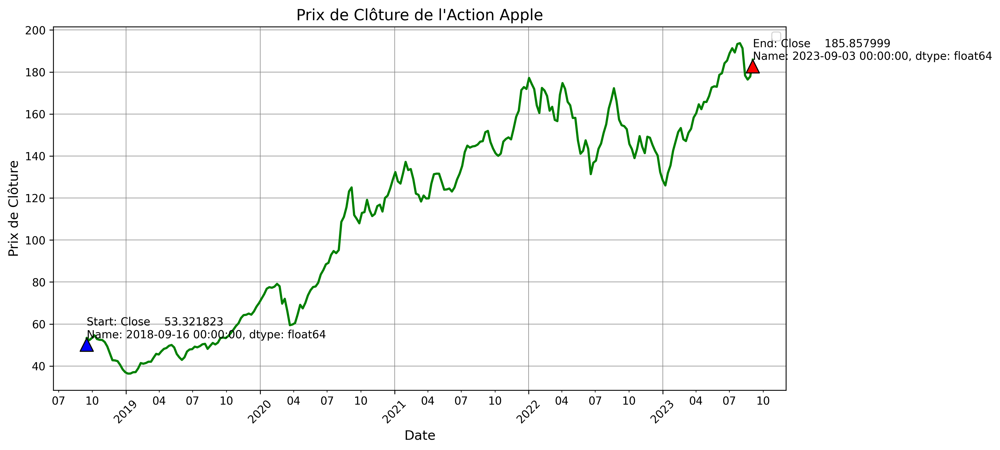

In [10]:
import matplotlib.dates as mdates

# Assuming apple_close is a pandas Series or DataFrame column with closing prices

# Set the figure size for HD resolution and higher DPI for better quality
plt.figure(figsize=(12, 6), dpi=300)

# Plotting apple_close with improved aesthetics
plt.plot(apple_close, color='green', linewidth=2, linestyle='-')

# Adding annotations for the start and end points
start_date = apple_close.index[0]
end_date = apple_close.index[-1]
start_price = apple_close.iloc[0]
end_price = apple_close.iloc[-1]

plt.annotate(f'Start: {start_price}', xy=(start_date, start_price), xytext=(start_date, start_price),
             arrowprops=dict(facecolor='blue', shrink=0.05))

plt.annotate(f'End: {end_price}', xy=(end_date, end_price), xytext=(end_date, end_price),
             arrowprops=dict(facecolor='red', shrink=0.05))

# Setting the title, labels, and legend
plt.title('Prix de Clôture de l\'Action Apple', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Prix de Clôture', fontsize=12)
plt.legend()

# Adding grid lines for better readability
plt.grid(True, which='major', linestyle='-', linewidth='0.5', color='gray')

# Formatting date labels on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
plt.gca().xaxis.set_minor_formatter(mdates.DateFormatter('%m'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_minor_locator(mdates.MonthLocator(bymonthday=1, interval=3))

# Rotating the date labels for better readability
plt.xticks(rotation=45)

# Display the plot
plt.show()


In [11]:
# Save the plot as a high-quality PNG file
plt.savefig('apple_stock_price.png', format='png', dpi=300)

<Figure size 640x480 with 0 Axes>

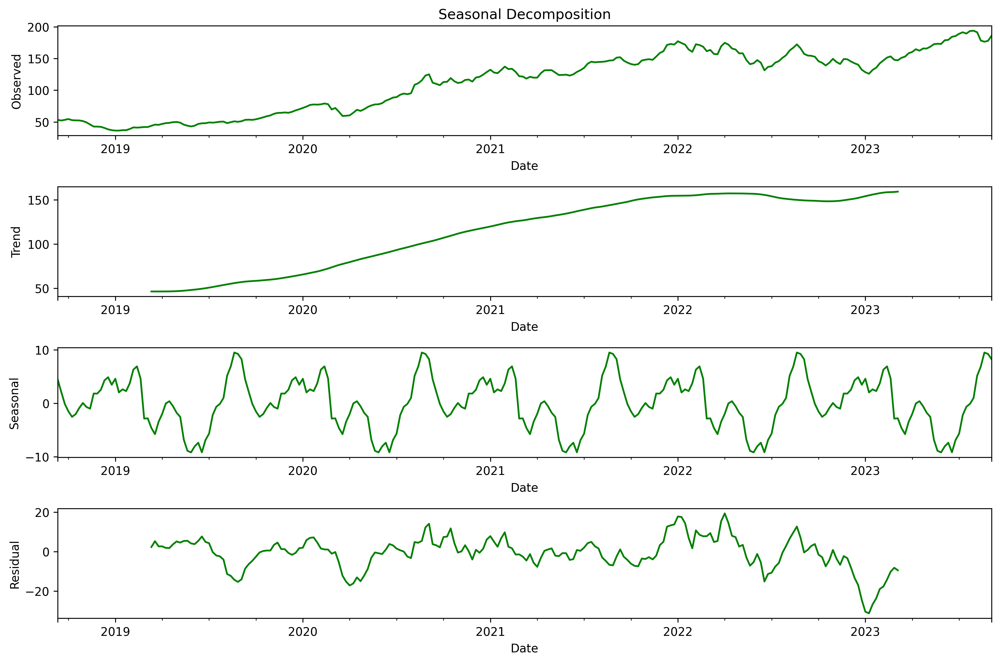

In [12]:
# Perform seasonal decomposition
decomposition = sm.tsa.seasonal_decompose(apple_close, model='additive')

# Set the size and resolution of the plot
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.dpi'] = 300

# Get the decomposition plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 8))

# Plotting each component with green color
decomposition.observed.plot(ax=ax1, color='green')
ax1.set_ylabel('Observed', color='black')
ax1.set_title('Seasonal Decomposition')

decomposition.trend.plot(ax=ax2, color='green')
ax2.set_ylabel('Trend', color='black')

decomposition.seasonal.plot(ax=ax3, color='green')
ax3.set_ylabel('Seasonal', color='black')

decomposition.resid.plot(ax=ax4, color='green')
ax4.set_ylabel('Residual', color='black')

# Adjusting layout for better display
plt.tight_layout()

# Show the plot
plt.show()


In [13]:
def perform_adf_test(dataframe, column):
    """
    Performs the Augmented Dickey-Fuller test on the specified column of the dataframe.

    Args:
    dataframe (pd.DataFrame): The DataFrame containing the time series data.
    column (str): The column name of the time series to be tested.

    Returns:
    None: The function prints the results of the ADF test.
    """
    # Perform ADF test
    adf_test = adfuller(dataframe[column])
    adf_output = pd.Series(adf_test[0:4], index=['Test Statistic', 'p_value', '#Lags Used', 'Number of Observations Used'])
    
    for key, value in adf_test[4].items():
        adf_output[f'Critical Value ({key})'] = value

    # Print the results of the ADF test
    print(adf_output)

    # Displaying if the series is stationary or not
    p_value = adf_test[1]
    if p_value < 0.05:
        print("\n===> The time series is stationary.")
    else:
        print("\n===> The time series is not stationary.")

In [14]:
perform_adf_test(apple_close, 'Close')

Test Statistic                  -0.626705
p_value                          0.864833
#Lags Used                       1.000000
Number of Observations Used    258.000000
Critical Value (1%)             -3.455953
Critical Value (5%)             -2.872809
Critical Value (10%)            -2.572775
dtype: float64

===> The time series is not stationary.


In [15]:
# Apply differentiation
apple_diff = apple_close['Close'].diff().dropna()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


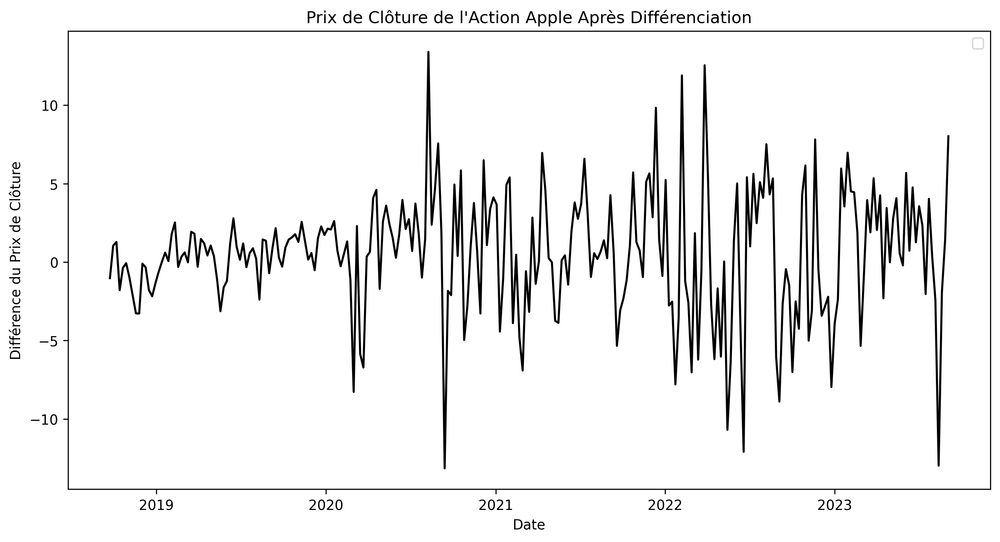

In [16]:
# Plotting the differentiated data
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(apple_diff, color='black')
plt.title('Prix de Clôture de l\'Action Apple Après Différenciation')
plt.xlabel('Date')
plt.ylabel('Différence du Prix de Clôture')
plt.legend()
plt.show()



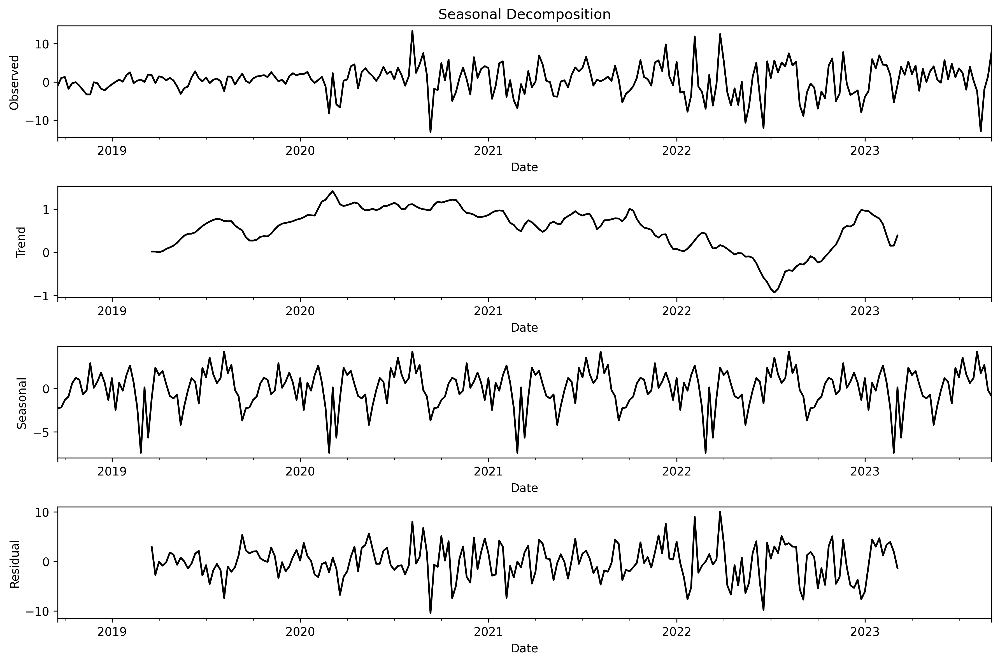

In [17]:
# Seasonal decomposition of the differentiated data
decomposition_diff = sm.tsa.seasonal_decompose(apple_diff, model='additive')
# Set the size and resolution of the plot
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.dpi'] = 300

# Get the decomposition plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 8))

# Plotting each component with green color
decomposition_diff.observed.plot(ax=ax1, color='black')
ax1.set_ylabel('Observed', color='black')
ax1.set_title('Seasonal Decomposition')

decomposition_diff.trend.plot(ax=ax2, color='black')
ax2.set_ylabel('Trend', color='black')

decomposition_diff.seasonal.plot(ax=ax3, color='black')
ax3.set_ylabel('Seasonal', color='black')

decomposition_diff.resid.plot(ax=ax4, color='black')
ax4.set_ylabel('Residual', color='black')

# Adjusting layout for better display
plt.tight_layout()

# Show the plot
plt.show()

In [18]:
# Perform ADF test on the differentiated data
perform_adf_test(pd.DataFrame(apple_diff), apple_diff.name)

Test Statistic                -1.214597e+01
p_value                        1.610493e-22
#Lags Used                     0.000000e+00
Number of Observations Used    2.580000e+02
Critical Value (1%)           -3.455953e+00
Critical Value (5%)           -2.872809e+00
Critical Value (10%)          -2.572775e+00
dtype: float64

===> The time series is stationary.


In [39]:
def split_time_series(data, column=None, test_percentage=0.05):
    """
    Splits a time series into training and test sets based on the specified test set percentage.

    Args:
    data (pd.DataFrame or pd.Series): The time series data.
    column (str, optional): The column name if data is a DataFrame. Default is None.
    test_percentage (float, optional): The percentage of data to be used as the test set. Default is 0.10 (10%).

    Returns:
    tuple: A tuple containing the training set and the test set.
    """
    # Calculate the number of points for the test set and ensure it's an integer
    n_test = int(len(data) * test_percentage)

    if isinstance(data, pd.DataFrame) and column:
        series_data = data[column]
    elif isinstance(data, pd.Series):
        series_data = data
    else:
        raise ValueError("Data must be a pandas DataFrame or Series")

    # Calculate the number of points for the training set
    n_train = len(series_data) - n_test

    # Split the data into training and test sets
    train_df = series_data.iloc[:n_train]
    test_df = series_data.iloc[-n_test:]

    return train_df, test_df, n_test 


In [102]:
train_df, test_df, n_test = split_time_series(apple_diff, 'Close', 0.05)

In [41]:
train_df.head()

Date
2018-09-23   -1.020947
2018-09-30    1.049200
2018-10-07    1.283363
2018-10-14   -1.787611
2018-10-21   -0.360587
Freq: W-SUN, Name: Close, dtype: float64

In [42]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
import numpy as np

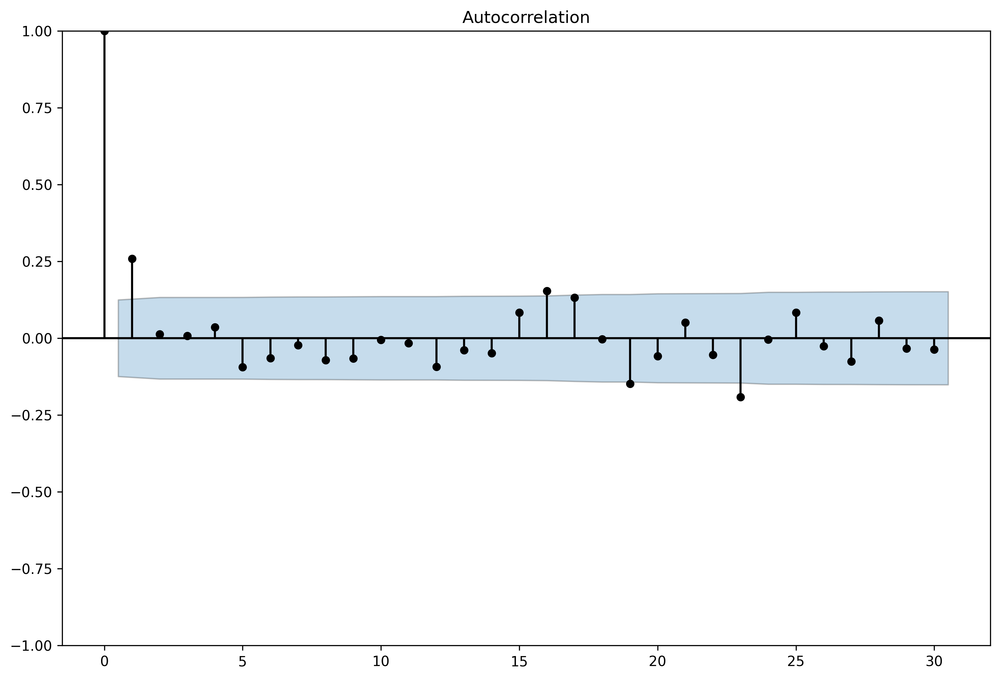

In [43]:
# Plot ACF
fig, ax = plt.subplots()
plot_acf(train_df, lags=30, ax=ax)

# Change the color of the ACF lines to black
for line in ax.get_lines():
    line.set_color('black')

# Optionally, change the color of the confidence interval band
for collection in ax.collections:
    collection.set_edgecolor('black')  # Change the edge color of the confidence interval
    # collection.set_alpha(0.2)  # Adjust transparency as needed

plt.show()


####################*Résultats pour l'odre MA q = 1
                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                  247
Model:                 ARIMA(0, 0, 1)   Log Likelihood                -673.347
Date:                Tue, 12 Dec 2023   AIC                           1352.694
Time:                        01:40:02   BIC                           1363.222
Sample:                    09-23-2018   HQIC                          1356.932
                         - 06-11-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5074      0.299      1.699      0.089      -0.078       1.093
ma.L1          0.2672      0.060      4.486      0.000       0.150       0.384


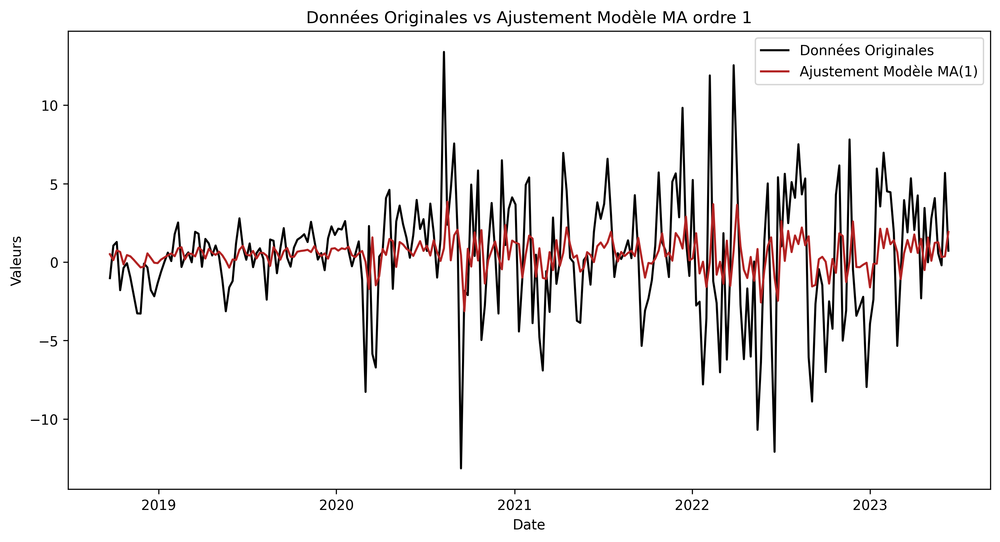

####################*Résultats pour l'odre MA q = 16
                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                  247
Model:                ARIMA(0, 0, 16)   Log Likelihood                -665.120
Date:                Tue, 12 Dec 2023   AIC                           1366.239
Time:                        01:40:05   BIC                           1429.408
Sample:                    09-23-2018   HQIC                          1391.671
                         - 06-11-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5008      0.239      2.096      0.036       0.032       0.969
ma.L1          0.2505      0.068      3.693      0.000       0.118       0.383

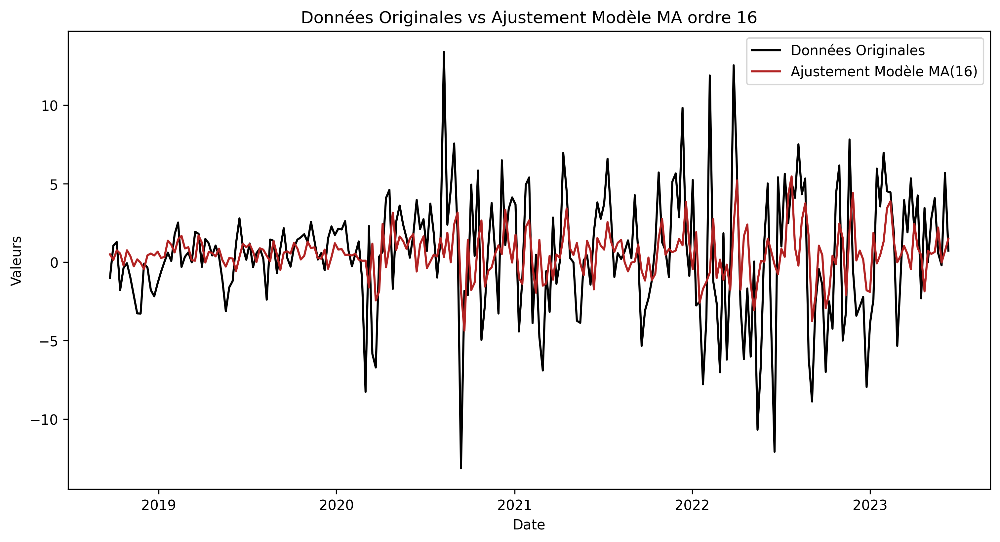

####################*Résultats pour l'odre MA q = 23
                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                  247
Model:                ARIMA(0, 0, 23)   Log Likelihood                -659.899
Date:                Tue, 12 Dec 2023   AIC                           1369.799
Time:                        01:40:09   BIC                           1457.533
Sample:                    09-23-2018   HQIC                          1405.121
                         - 06-11-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5169      0.186      2.778      0.005       0.152       0.882
ma.L1          0.2569      0.069      3.744      0.000       0.122       0.391

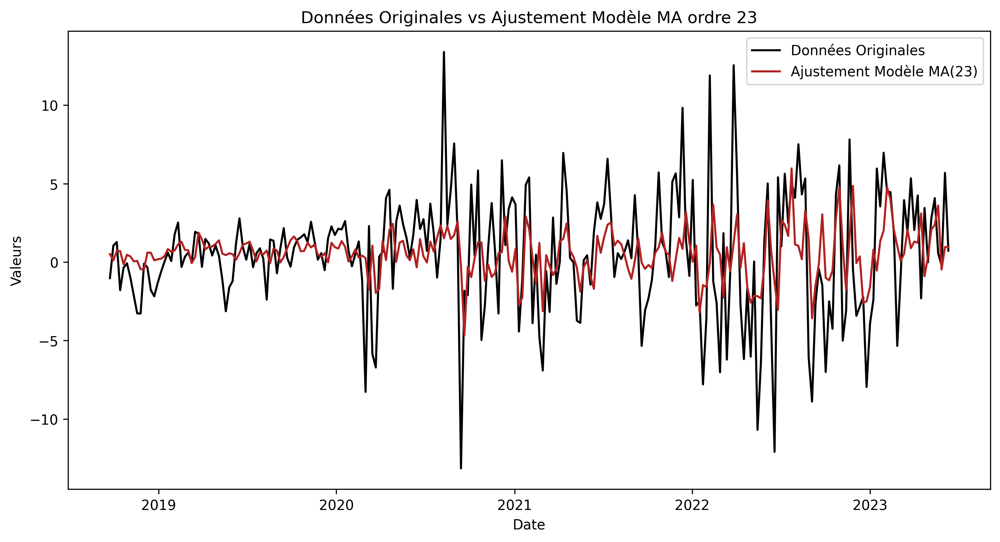

In [45]:
MA_Order = [1, 16, 23]
aic_values = {}

for q in MA_Order:
    print("####################*Résultats pour l'odre MA q =", q)
    model_ma = ARIMA(train_df, order=(0, 0, q))
    results_ma = model_ma.fit()
    
    # Afficher le résumé du modèle
    print(results_ma.summary())

    # Stocker la valeur AIC
    aic_values[q] = results_ma.aic

    # Récupérer les ajustements du modèle
    fitted_values_ma = results_ma.fittedvalues
    
    # Créer le graphique des données et de l'ajustement
    plt.figure(figsize=(12, 6))
    plt.plot(train_df, color='black', label='Données Originales')
    plt.plot(fitted_values_ma, color='firebrick', label='Ajustement Modèle MA(' + str(q) + ')', linestyle='-')
    plt.title('Données Originales vs Ajustement Modèle MA ordre ' + str(q))
    plt.xlabel('Date')
    plt.ylabel('Valeurs')
    plt.legend()
    plt.show()


In [47]:
# Afficher les valeurs AIC pour chaque modèle
print("Valeurs AIC et BIC pour chaque ordre MA :")
for q, aic in aic_values.items():
    print(f"MA({q}): AIC = {aic}")

Valeurs AIC et BIC pour chaque ordre MA :
MA(1): AIC = 1352.6937036591744
MA(16): AIC = 1366.2391179955894
MA(23): AIC = 1369.7986027837148


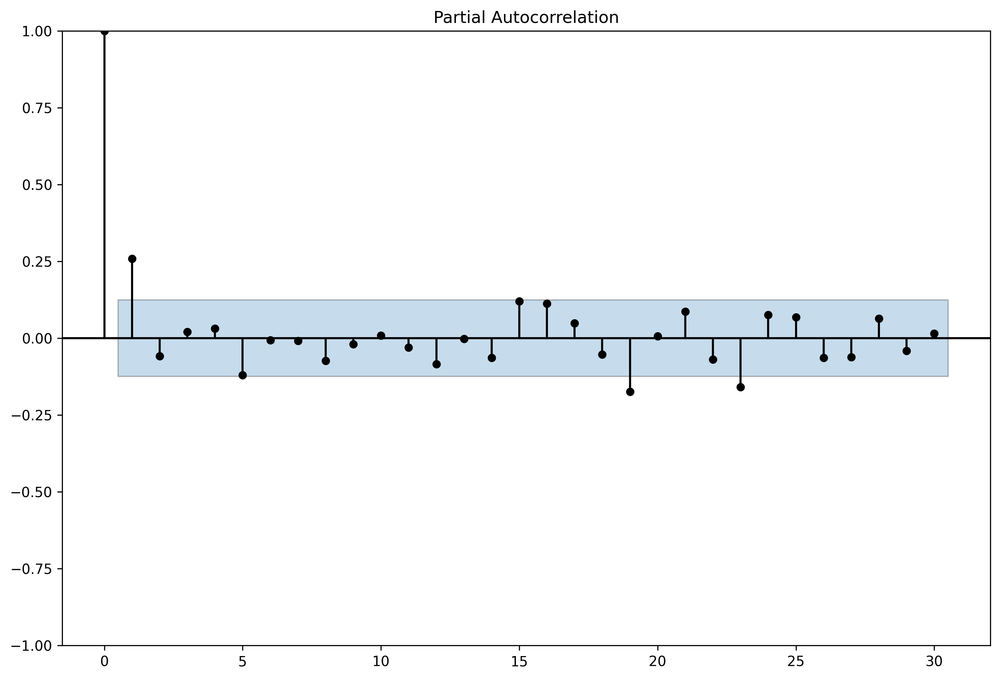

In [48]:
# Plot PACF
fig, ax = plt.subplots()
plot_pacf(train_df, lags=30, ax=ax)

# Change the color of the PACF lines to black
for line in ax.get_lines():
    line.set_color('black')

# If needed, change the color of the confidence interval band
for collection in ax.collections:
    collection.set_edgecolor('black')  # Change the edge color of the confidence interval
    # collection.set_alpha(0.2)  # Adjust transparency as needed

plt.show()


####################*Résultats pour l'odre AR p = 1
                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                  247
Model:                 ARIMA(1, 0, 0)   Log Likelihood                -673.725
Date:                Tue, 12 Dec 2023   AIC                           1353.450
Time:                        01:42:48   BIC                           1363.978
Sample:                    09-23-2018   HQIC                          1357.689
                         - 06-11-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5085      0.321      1.583      0.113      -0.121       1.138
ar.L1          0.2580      0.062      4.188      0.000       0.137       0.379


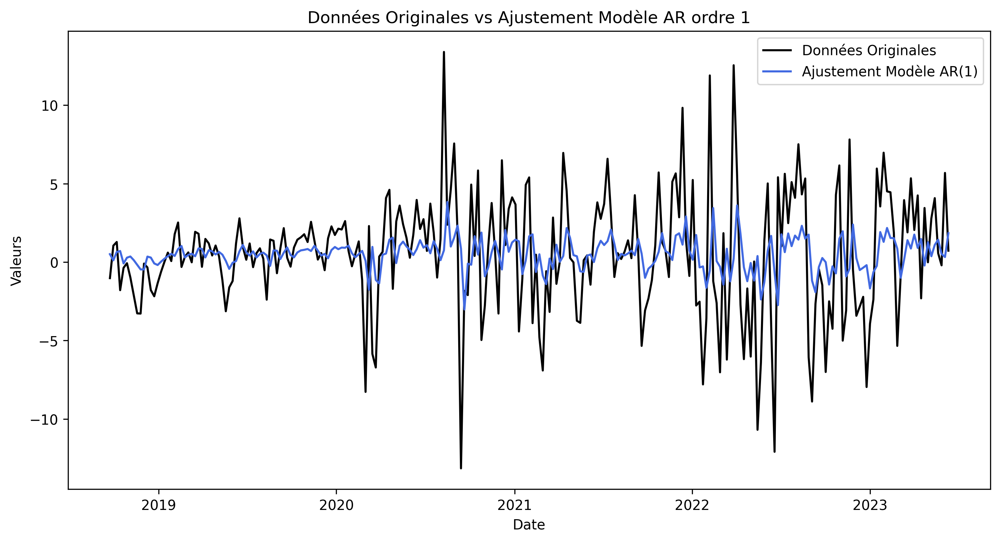

####################*Résultats pour l'odre AR p = 19
                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                  247
Model:                ARIMA(19, 0, 0)   Log Likelihood                -661.205
Date:                Tue, 12 Dec 2023   AIC                           1364.410
Time:                        01:42:52   BIC                           1438.107
Sample:                    09-23-2018   HQIC                          1394.081
                         - 06-11-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4979      0.240      2.078      0.038       0.028       0.968
ar.L1          0.2539      0.069      3.654      0.000       0.118       0.390

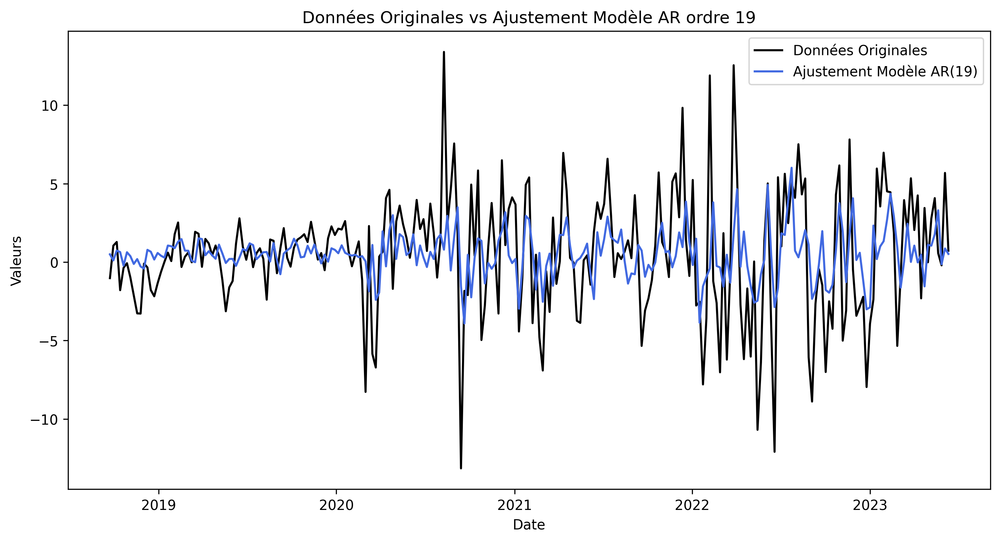

####################*Résultats pour l'odre AR p = 23
                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                  247
Model:                ARIMA(23, 0, 0)   Log Likelihood                -656.692
Date:                Tue, 12 Dec 2023   AIC                           1363.383
Time:                        01:42:58   BIC                           1451.118
Sample:                    09-23-2018   HQIC                          1398.706
                         - 06-11-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4938      0.218      2.267      0.023       0.067       0.921
ar.L1          0.2475      0.071      3.479      0.001       0.108       0.387

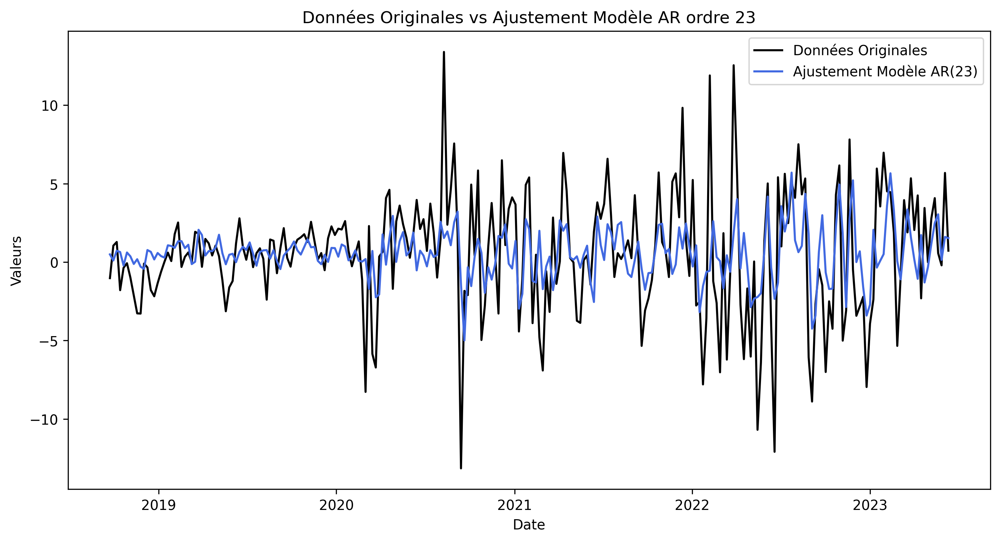

In [49]:
AR_model = [1, 19, 23]
aic_values = {}

for p in AR_model:
    print("####################*Résultats pour l'odre AR p =", p)
    model_ar = ARIMA(train_df, order=(p, 0, 0))
    results_ar = model_ar.fit()
    
    # Afficher le résumé du modèle
    print(results_ar.summary())

    # Stocker la valeur AIC
    aic_values[p] = results_ar.aic

    # Récupérer les ajustements du modèle
    fitted_values = results_ar.fittedvalues
    
    # Créer le graphique
    plt.figure(figsize=(12, 6))
    plt.plot(train_df, color='black', label='Données Originales')
    plt.plot(fitted_values, color='royalblue', linestyle='-', label='Ajustement Modèle AR(' + str(p) + ')')
    plt.title('Données Originales vs Ajustement Modèle AR ordre ' + str(p))
    plt.xlabel('Date')
    plt.ylabel('Valeurs')
    plt.legend()
    plt.show()


In [50]:
# Afficher les valeurs AIC pour chaque modèle
print("Valeurs AIC pour chaque ordre AR :")
for p, aic in aic_values.items():
    print(f"AR({p}): AIC = {aic}")

Valeurs AIC pour chaque ordre AR :
AR(1): AIC = 1353.4498331676823
AR(19): AIC = 1364.4096336488788
AR(23): AIC = 1363.3831650469601


In [51]:
def find_best_arima_models(data, max_ar, max_ma):
    """
    Fits ARIMA models with various combinations of AR and MA orders, 
    calculates their AIC values, and returns the best three models.

    Args:
    data (pd.Series): Time series data.
    max_ar (int): Maximum number of AR terms to consider.
    max_ma (int): Maximum number of MA terms to consider.

    Returns:
    pd.DataFrame: DataFrame with model orders and corresponding AIC values,
                  and the top three models based on AIC.
    """
    aic_values = {}

    # Iterate over AR and MA order ranges
    for p in range(max_ar + 1):
        for q in range(max_ma + 1):
            try:
                model = ARIMA(data, order=(p, 0, q))
                results = model.fit()
                aic_values[(p, q)] = results.aic
            except:
                aic_values[(p, q)] = None

    # Convert to DataFrame
    aic_df = pd.DataFrame(list(aic_values.items()), columns=['Order (p,q)', 'AIC'])

    # Sort by AIC values to find the best models
    aic_df = aic_df.sort_values(by='AIC')

    # Extract the top three models
    top_models = aic_df.head(3)

    return aic_df, top_models

In [317]:
# Example usage
# Assuming 'train_df' is your time series data
aic_matrix, top_three_models = find_best_arima_models(train_df, max_ar=23, max_ma=23)
print("AIC Matrix:\n", aic_matrix)
print("\nTop Three Models:\n", top_three_models)


C:\Users\AX2B\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\AX2B\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\AX2B\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\AX

AIC Matrix:
     Order (p,q)          AIC
1        (0, 1)  1286.266943
74       (3, 2)  1286.315122
24       (1, 0)  1287.590836
2        (0, 2)  1288.235890
48       (2, 0)  1288.238728
25       (1, 1)  1288.241105
410     (17, 2)  1289.111122
122      (5, 2)  1289.218073
26       (1, 2)  1289.615466
3        (0, 3)  1289.871457
72       (3, 0)  1290.075590
49       (2, 1)  1290.166735
120      (5, 0)  1290.212930
4        (0, 4)  1290.277755
50       (2, 2)  1290.451203
27       (1, 3)  1290.913450
29       (1, 5)  1290.915496
56       (2, 8)  1290.983738
98       (4, 2)  1291.055739
76       (3, 4)  1291.117979
121      (5, 1)  1291.171048
434     (18, 2)  1291.273506
458     (19, 2)  1291.280912
99       (4, 3)  1291.388739
111     (4, 15)  1291.523135
411     (17, 3)  1291.622298
101      (4, 5)  1291.628294
5        (0, 5)  1291.636945
96       (4, 0)  1291.867867
51       (2, 3)  1291.950941
100      (4, 4)  1291.955423
73       (3, 1)  1292.055556
28       (1, 4)  1292.067605
1

In [52]:
def fit_arima_model(data, ar_order, ma_order):
    """
    Fits an ARIMA model and returns the fitted model.

    Args:
    data (pd.Series): Time series data.
    ar_order (int): AR order.
    ma_order (int): MA order.

    Returns:
    The fitted ARIMA model.
    """
    model = ARIMA(data, order=(ar_order, 0, ma_order))
    results = model.fit()
    return results

In [53]:
# Fit the ARIMA model
results_arma = fit_arima_model(train_df, 3, 2) 
results_arma.summary() 

C:\Users\AX2B\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\AX2B\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\AX2B\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  Close   No. Observations:                  247
Model:                 ARIMA(3, 0, 2)   Log Likelihood                -669.265
Date:                Tue, 12 Dec 2023   AIC                           1352.530
Time:                        01:43:34   BIC                           1377.095
Sample:                    09-23-2018   HQIC                          1362.420
                         - 06-11-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4997      0.333      1.501      0.133      -0.153       1.152
ar.L1         -0.0836      0.064     -1.299      0.194      -0.210       0.043
ar.L2         -0.8722      0.031    -27.997      0.000      -0.933      -0.811
ar.L3          0.2936      0.062      4.698      0.000       0.171       0.416
ma.L1          0.3510      0.032     11.099      0.000       0.289       0.413
ma.L2          0.9786      0.028     34.730      0.000       0.923       1.034
sigma2        13.0866      0.864     15.154      0.000      11.394      14.779
===================================================================================
Ljung-Box (L1) (Q):                   0.07   Jarque-Bera (JB):                44.65
Prob(Q):                              0.79   Prob(JB):                         0.00
Heteroskedasticity (H):               6.62   Skew:                            -0.11
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.07
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

NameError: name 'fitted_values_arma' is not defined

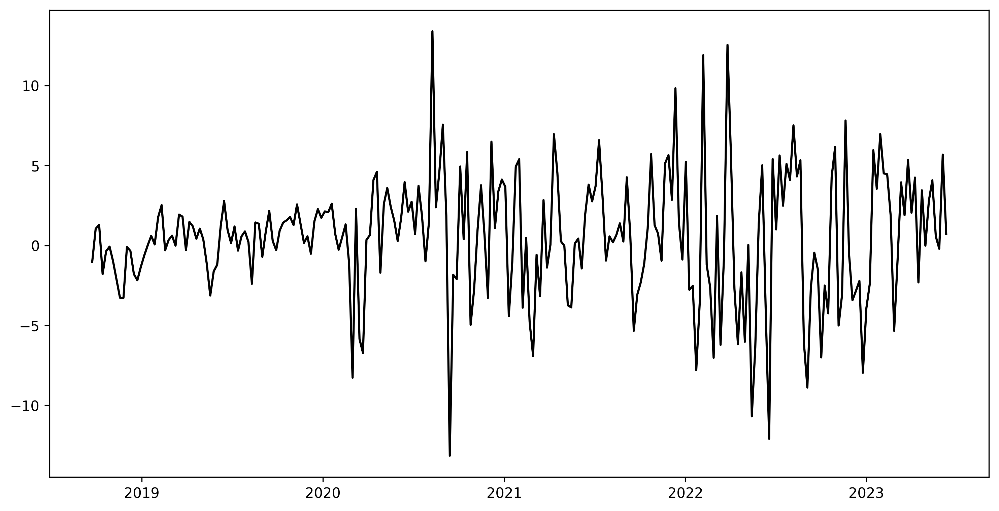

In [54]:
import matplotlib.pyplot as plt

# Assuming train_df contains your original data and fitted_values_arma contains the fitted values from the ARMA model

# Créer le graphique
plt.figure(figsize=(12, 6))
plt.plot(train_df, color='black', label='Données Originales')
plt.plot(fitted_values_arma, color='royalblue', linestyle='-', label='Ajustement Modèle ARMA(3,2)')
plt.title('Données Originales vs Ajustement Modèle ARMA(3,2)')
plt.xlabel('Date')
plt.ylabel('Valeurs')
plt.legend()
plt.show()


In [55]:
# Forecast for n_test steps ahead
forecast = results_arma.get_forecast(steps=n_test)
forecast_values = forecast.predicted_mean
forecast_conf_int = forecast.conf_int()

# Assuming that test_df's index is a datetime index and aligns with the forecast period
forecast_index = test_df.index

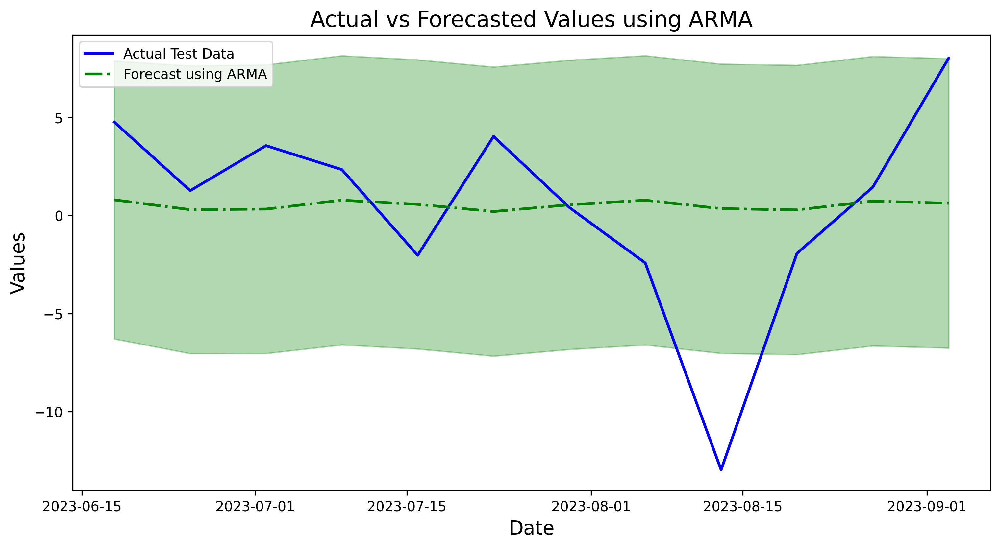

<Figure size 3600x2400 with 0 Axes>

In [56]:
# Plotting the results
plt.figure(figsize=(12, 6), dpi=300)

# Plot actual test data
plt.plot(test_df, label='Actual Test Data', color='blue', linestyle='-', linewidth=2)

# Plot forecasts
plt.plot(forecast_index, forecast_values, label='Forecast using ARMA', color='green', linestyle='-.', linewidth=2)

# Plot confidence intervals
plt.fill_between(forecast_index, forecast_conf_int.iloc[:, 0], forecast_conf_int.iloc[:, 1], color='green', alpha=0.3)

# Adding titles and labels
plt.title('Actual vs Forecasted Values using ARMA', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Values', fontsize=14)
plt.legend()

# Show the plot
plt.show()

# Optionally, save the plot
plt.savefig('forecast_vs_actual_ARMA.png', format='png', dpi=300)


In [57]:
def check_residuals_acf(residus, model_type):
    """
    Plots the Autocorrelation Function (ACF) of the residuals of a given model.

    Args:
    residus (pd.Series): The residuals of the model.
    model_type (str): A string indicating the type of model (e.g., 'MA', 'AR', 'ARMA').
    """
    print(f"Autocorrelation résidus {model_type}")
    fig, ax = plt.subplots()
    plot_acf(residus, ax=ax)

    # Change the color of the ACF lines to black
    for line in ax.get_lines():
        line.set_color('black')

    # Optionally, change the color of the confidence interval band
    for collection in ax.collections:
        collection.set_edgecolor('black')  # Change the edge color of the confidence interval
        collection.set_alpha(0.2)  # Adjust transparency as needed

    plt.show()

Autocorrelation résidus MA


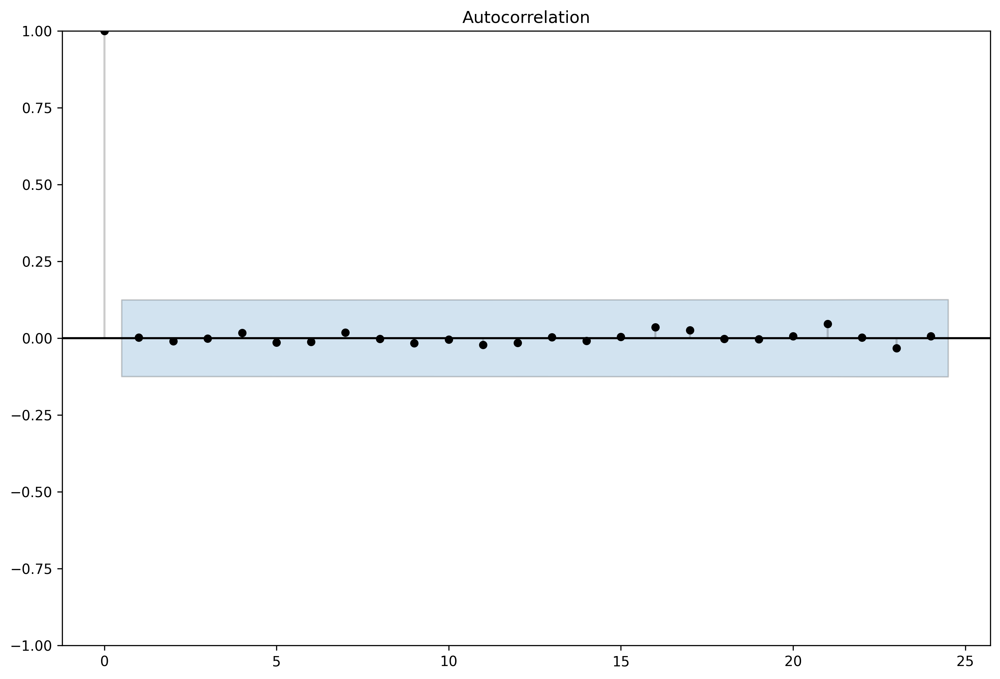

Autocorrelation résidus AR


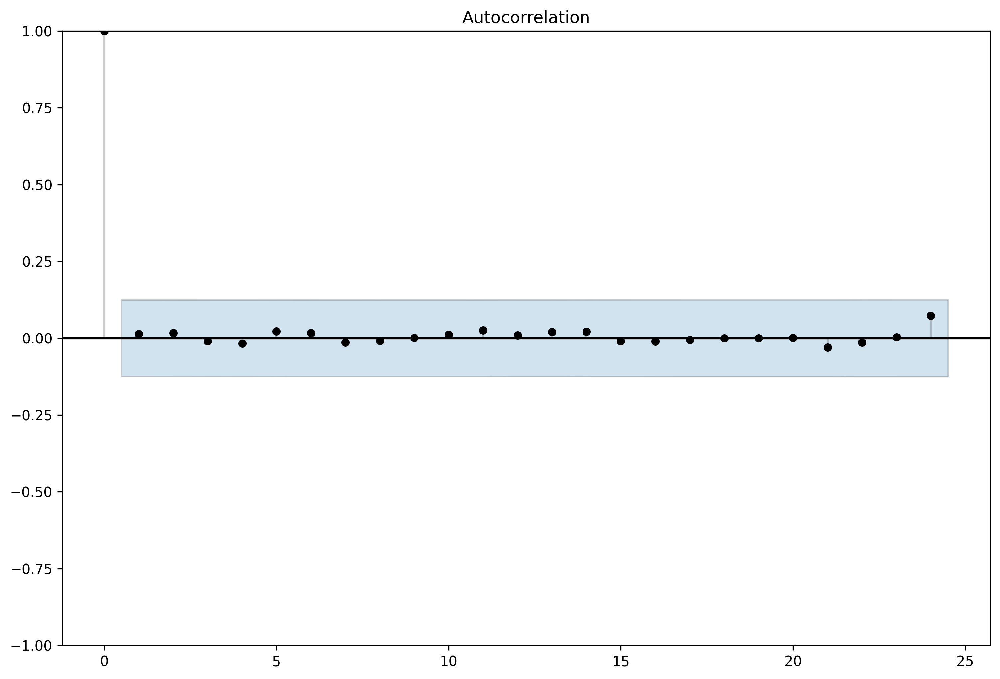

Autocorrelation résidus ARMA


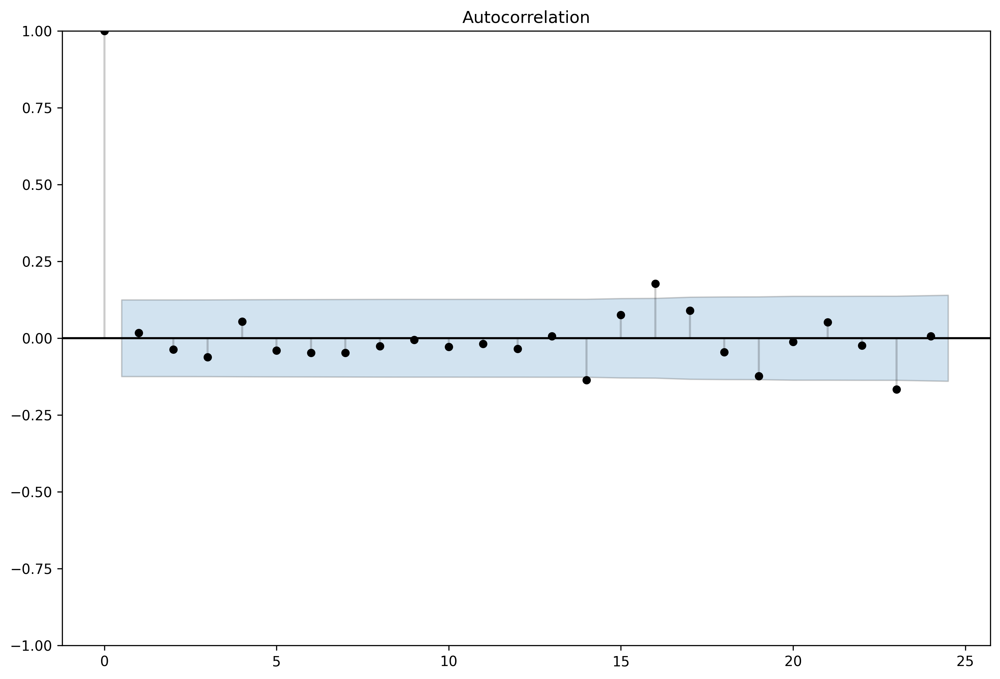

In [58]:
# Assuming results_ma, results_ar, results_arma are your model results
check_residuals_acf(results_ma.resid, 'MA')
check_residuals_acf(results_ar.resid, 'AR')
check_residuals_acf(results_arma.resid, 'ARMA')

In [59]:
import scipy.stats as stats

def check_residuals_normality(residus, title):
    # Histogram with black-bordered rectangles and normal distribution curve
    plt.figure(figsize=(12, 6))
    n, bins, patches = plt.hist(residus, bins=30, density=True, edgecolor='black', linewidth=1.2, facecolor='none')

    # Add normal distribution curve
    mu, std = stats.norm.fit(residus)
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = stats.norm.pdf(x, mu, std)
    plt.plot(x, p, 'k', linewidth=2)
    plt.title(f'Histogramme des Résidus - {title}')
    plt.show()

    # Q-Q plot with royal blue reference line and black data points
    plt.figure(figsize=(12, 6))
    (osm, osr), (slope, intercept, r) = stats.probplot(residus, dist="norm", plot=None)
    plt.scatter(osm, osr, facecolor='black')
    plt.plot(osm, slope*osm + intercept, 'royalblue', label='Ligne de Référence')
    plt.legend()
    plt.title(f'Diagramme Q-Q - {title}')
    plt.show()

    # Shapiro-Wilk test
    shapiro_test = stats.shapiro(residus)
    print(f"Résultats du Test de Shapiro-Wilk - {title} : {shapiro_test}")

    # Kolmogorov-Smirnov test
    ks_test = stats.kstest(residus, 'norm')
    print(f"Résultats du Test de Kolmogorov-Smirnov - {title} : {ks_test}")

    # Anderson-Darling test
    ad_test = stats.anderson(residus, 'norm')
    print(f"Résultats du Test d'Anderson-Darling - {title} : {ad_test}")

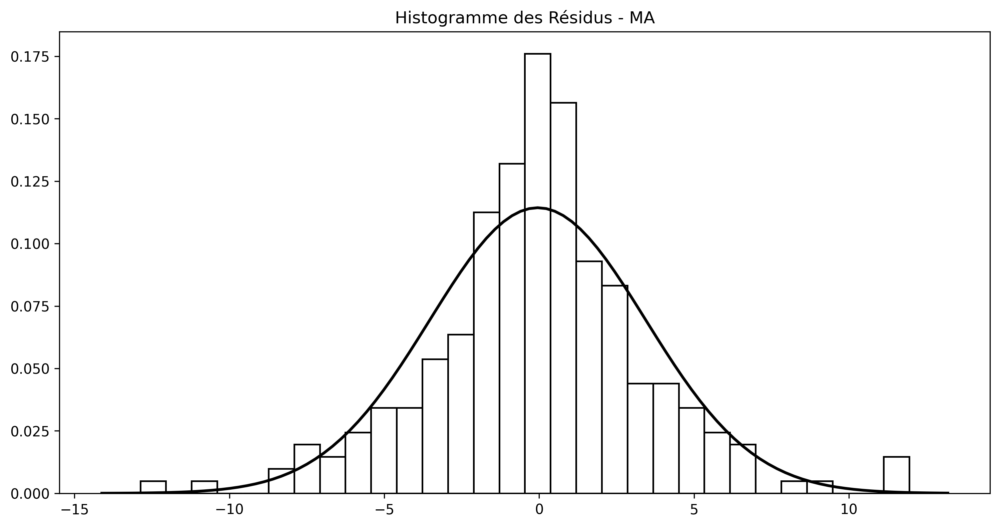

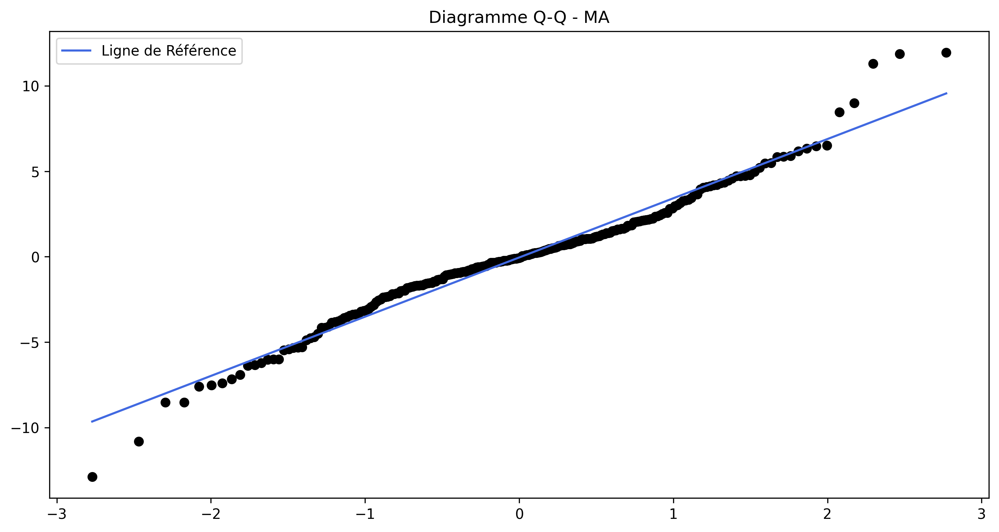

Résultats du Test de Shapiro-Wilk - MA : ShapiroResult(statistic=0.9725156426429749, pvalue=0.0001034372253343463)
Résultats du Test de Kolmogorov-Smirnov - MA : KstestResult(statistic=0.22390481657721928, pvalue=2.3245454732892282e-11)
Résultats du Test d'Anderson-Darling - MA : AndersonResult(statistic=2.1096716588953655, critical_values=array([0.567, 0.646, 0.775, 0.904, 1.075]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))


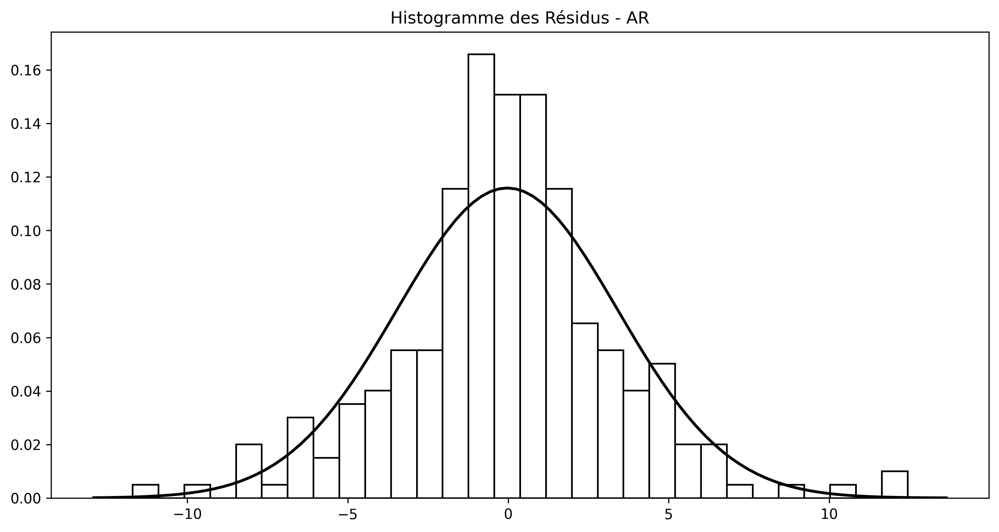

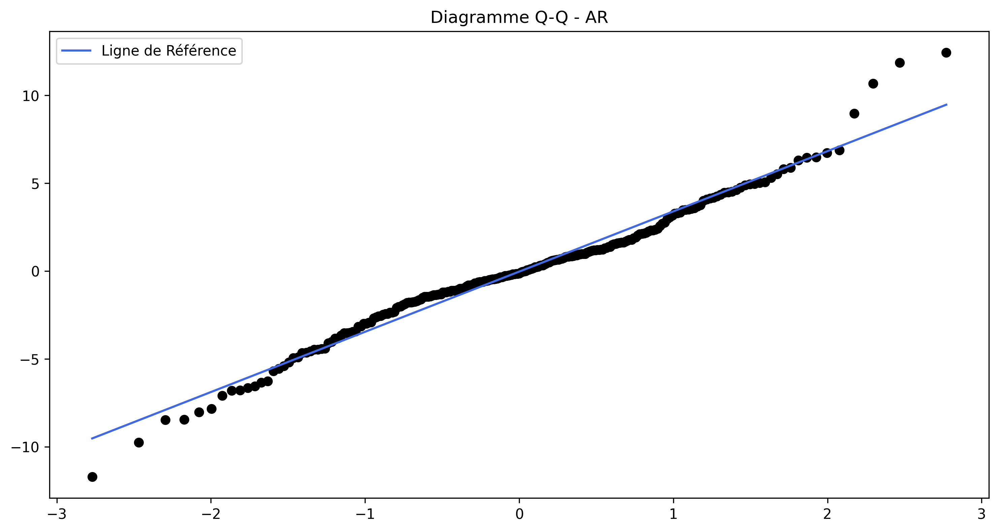

Résultats du Test de Shapiro-Wilk - AR : ShapiroResult(statistic=0.9769589304924011, pvalue=0.00048266048543155193)
Résultats du Test de Kolmogorov-Smirnov - AR : KstestResult(statistic=0.2136690244146528, pvalue=2.242375397966421e-10)
Résultats du Test d'Anderson-Darling - AR : AndersonResult(statistic=1.77738802649111, critical_values=array([0.567, 0.646, 0.775, 0.904, 1.075]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))


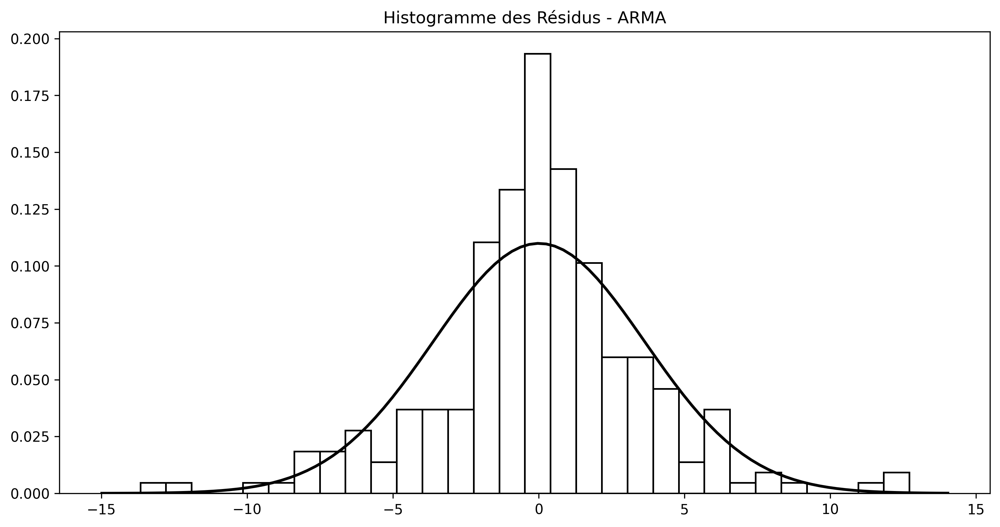

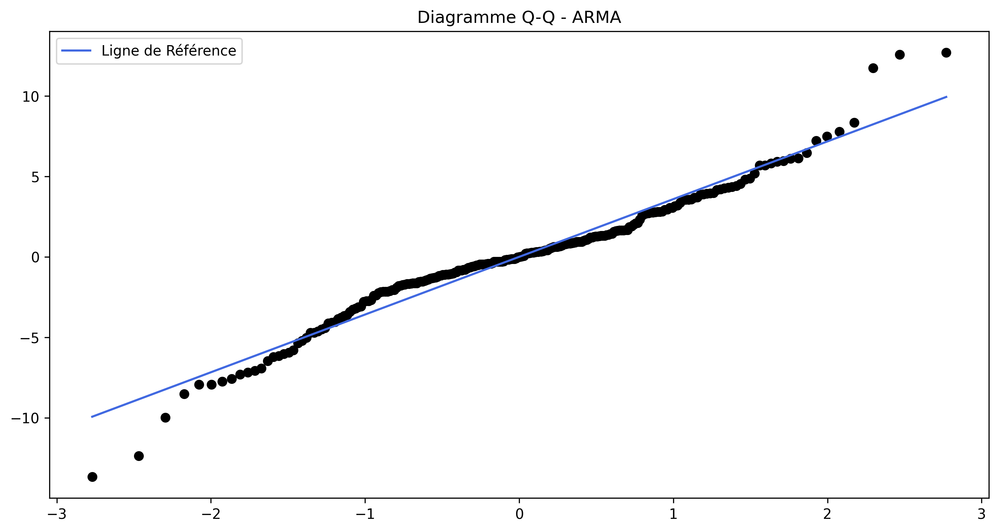

Résultats du Test de Shapiro-Wilk - ARMA : ShapiroResult(statistic=0.9635645747184753, pvalue=6.326898073893972e-06)
Résultats du Test de Kolmogorov-Smirnov - ARMA : KstestResult(statistic=0.2130565959964804, pvalue=2.5590901219733404e-10)
Résultats du Test d'Anderson-Darling - ARMA : AndersonResult(statistic=2.8572248939219094, critical_values=array([0.567, 0.646, 0.775, 0.904, 1.075]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))


In [60]:
# Verify residuals for each model
# Assuming residus_ma, residus_ar, residus_arma are your model residuals
check_residuals_normality(results_ma.resid, "MA")
check_residuals_normality(results_ar.resid, "AR")
check_residuals_normality(results_arma.resid, "ARMA")

In [61]:
from arch import arch_model

# Function to fit GARCH(1,1) model
def fit_garch_model(residus, model_type):
    garch_model = arch_model(residus, vol='Garch', p=1, q=1)
    garch_result = garch_model.fit(disp='off')
    print(f"####################*Résultats du modèle GARCH(1,1) pour les résidus {model_type}")
    print(garch_result.summary())
    return garch_result

# Function to fit ARCH(1) model
def fit_arch_model(residus, model_type):
    arch_model = arch_model(residus, vol='ARCH', p=1)
    arch_result = arch_model.fit(disp='off')
    print(f"####################*Résultats du modèle ARCH(1) pour les résidus {model_type}")
    print(arch_result.summary())
    return arch_result

# Function to test parameter nullity
def test_parameter_significance(model, parameter, model_type):
    p_value = model.pvalues[parameter]
    print(f"\nP-value pour {parameter} dans le modèle {model_type}: {p_value}")
    if p_value < 0.05:
        print(f"Le paramètre {parameter} est statistiquement significatif.")
    else:
        print(f"Le paramètre {parameter} n'est pas statistiquement significatif.")


In [62]:
# Example usage
garch_result_arma = fit_garch_model(results_arma.resid, "ARMA")
test_parameter_significance(garch_result_arma, 'beta[1]', "GARCH(1,1) - ARMA")

####################*Résultats du modèle GARCH(1,1) pour les résidus ARMA
                     Constant Mean - GARCH Model Results                      
Dep. Variable:                   None   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -635.445
Distribution:                  Normal   AIC:                           1278.89
Method:            Maximum Likelihood   BIC:                           1292.93
                                        No. Observations:                  247
Date:                Tue, Dec 12 2023   Df Residuals:                      246
Time:                        01:43:58   Df Model:                            1
                               Mean Model                               
                 coef    std err          t      P>|t|  95.0% Conf. Int.
---------------------------------------------------------------------

In [63]:
def plot_garch_results(garch_result, title):
    fig, axs = plt.subplots(2, 1, figsize=(12, 8))

    # Plot conditional volatility in black
    axs[0].plot(garch_result.conditional_volatility, label='Conditional Volatility', color='black')
    axs[0].set_title(f'Conditional Volatility - {title}')
    axs[0].legend()

    # Plot standardized residuals in black
    standardized_residuals = garch_result.resid / garch_result.conditional_volatility
    axs[1].plot(standardized_residuals, label='Standardized Residuals', color='black')
    axs[1].set_title(f'Standardized Residuals - {title}')
    axs[1].legend()

    plt.tight_layout()
    plt.show()

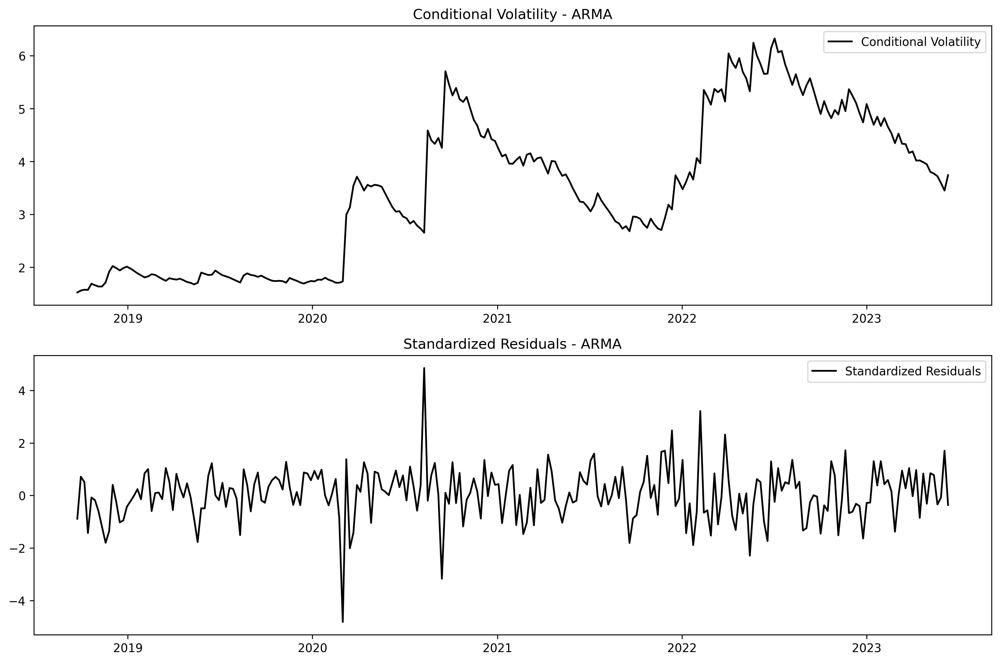

In [64]:
# Example usage
plot_garch_results(garch_result_arma, "ARMA")

In [65]:
# Forecast the next 10% values
arma_forecast = results_arma.get_forecast(n_test)
arma_mean_forecast = arma_forecast.predicted_mean
arma_conf_int = arma_forecast.conf_int()

# Fit a GARCH model on the residuals
garch_model = arch_model(results_arma.resid, vol='Garch', p=1, q=1)
garch_results = garch_model.fit(last_obs=len(train_df) - n_test)

# Forecast conditional volatility for the next 10% values
garch_forecast = garch_results.forecast(horizon=n_test)
conditional_volatility = np.sqrt(garch_forecast.variance.values[-1, :])

# Construct prediction intervals for the two-step estimator
lower_bound = arma_mean_forecast - 1.96 * conditional_volatility
upper_bound = arma_mean_forecast + 1.96 * conditional_volatility

# One-step estimator (ARMA-GARCH) is more complex and not directly supported in current Python packages.
# However, conceptually, it involves fitting an ARMA-GARCH model to the data and then performing
# a similar forecasting procedure as above.

# Print the prediction intervals
print("Two-Step Estimator Prediction Intervals:")
for i in range(n_test):
    print(f"Day {i+1}: Lower Bound: {lower_bound[i]}, Upper Bound: {upper_bound[i]}")


Iteration:      1,   Func. Count:      6,   Neg. LLF: 909.4733160141692
Iteration:      2,   Func. Count:     13,   Neg. LLF: 682.9451332413598
Iteration:      3,   Func. Count:     20,   Neg. LLF: 622.3942456885438
Iteration:      4,   Func. Count:     26,   Neg. LLF: 606.0368379144302
Iteration:      5,   Func. Count:     32,   Neg. LLF: 604.1701429441524
Iteration:      6,   Func. Count:     37,   Neg. LLF: 604.2183726937112
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1046.0071079649526
Iteration:      8,   Func. Count:     50,   Neg. LLF: 604.0921092058643
Iteration:      9,   Func. Count:     56,   Neg. LLF: 604.0777752851292
Iteration:     10,   Func. Count:     61,   Neg. LLF: 604.0777693049365
Iteration:     11,   Func. Count:     65,   Neg. LLF: 604.0777691948889
Optimization terminated successfully    (Exit mode 0)
            Current function value: 604.0777693049365
            Iterations: 11
            Function evaluations: 65
            Gradient evaluations: 1

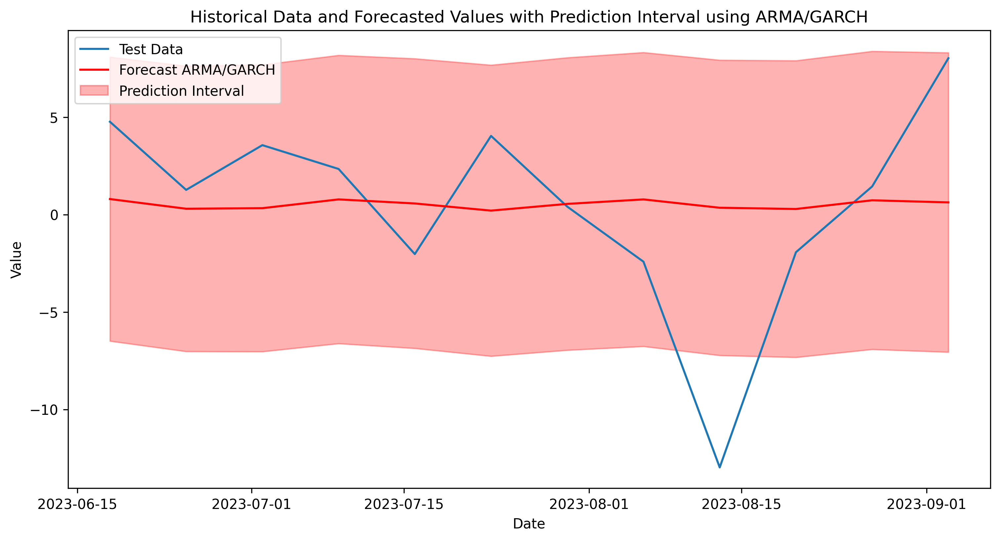

In [89]:
# Create the forecast index starting from the day after the last day in train_df
last_date = train_df.index[-1]
forecast_index = pd.date_range(start=last_date, periods=n_test + 1, freq='W')[1:]  # Exclude the start date

# Create the forecast DataFrame
forecast_df = pd.DataFrame(index=forecast_index)
forecast_df['Forecast'] = arma_mean_forecast
forecast_df['Lower Bound'] = lower_bound
forecast_df['Upper Bound'] = upper_bound

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(test_df, label='Test Data')
plt.plot(forecast_df['Forecast'], color='red', label='Forecast ARMA/GARCH')
plt.fill_between(forecast_df.index, forecast_df['Lower Bound'], forecast_df['Upper Bound'], color='red', alpha=0.3, label='Prediction Interval')
plt.title('Historical Data and Forecasted Values with Prediction Interval using ARMA/GARCH')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


In [67]:
print(data.columns)

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Dividends',
       'Stock Splits', 'Brand_Name', 'Ticker', 'Industry_Tag', 'Country'],
      dtype='object')


In [68]:
# Define the brand and column names
brand_name = 'apple'
column_names = ['Open', 'High', 'Low', 'Volume']

# Dictionary to store the isolated columns
isolated_columns = {}

# Populate the dictionary with DataFrames for each stock attribute
for name in column_names:
    isolated_columns[name] = isolate_column(data, brand_name, name)

# Extract each DataFrame from the dictionary
apple_open = isolated_columns['Open']
apple_high = isolated_columns['High']
apple_low = isolated_columns['Low']
apple_volume = isolated_columns['Volume']


C:\Users\AX2B\AppData\Local\Temp\ipykernel_18756\3782093789.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_df['Date'] = pd.to_datetime(selected_df['Date'].str.split(" ").str[0])
C:\Users\AX2B\AppData\Local\Temp\ipykernel_18756\3782093789.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_df.sort_values('Date', inplace=True)
C:\Users\AX2B\AppData\Local\Temp\ipykernel_18756\3782093789.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

S

In [69]:
brands = ['apple', 'microsoft', 'google', 'cisco']
closing_prices = pd.DataFrame()

for brand in brands:
    weekly_close = isolate_column(data, brand, 'Close')
    closing_prices[brand + '_close'] = weekly_close['Close']
closing_prices.head()

C:\Users\AX2B\AppData\Local\Temp\ipykernel_18756\3782093789.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_df['Date'] = pd.to_datetime(selected_df['Date'].str.split(" ").str[0])
C:\Users\AX2B\AppData\Local\Temp\ipykernel_18756\3782093789.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_df.sort_values('Date', inplace=True)
C:\Users\AX2B\AppData\Local\Temp\ipykernel_18756\3782093789.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

S

,apple_close,microsoft_close,google_close,cisco_close
Date,,,,
2018-09-16,53.321823,105.848949,58.967699,40.513410
2018-09-23,52.300876,107.037022,58.649000,40.944971
2018-09-30,53.350076,108.363434,59.819500,41.660225
2018-10-07,54.633438,108.168259,59.725999,41.983895
2018-10-14,52.845827,103.222676,56.045300,39.894124


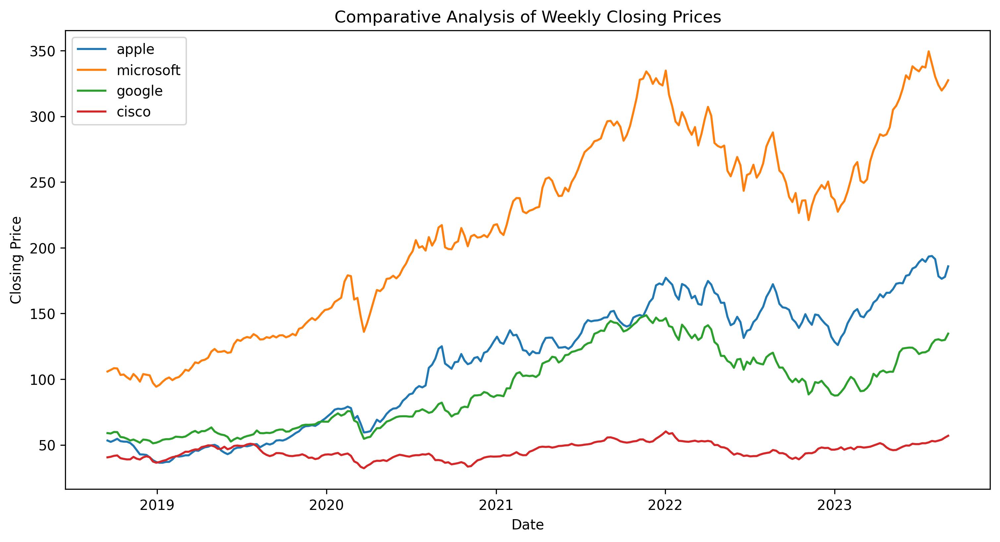

In [70]:
plt.figure(figsize=(12, 6))
for brand in brands:
    plt.plot(closing_prices[brand + '_close'], label=brand)

plt.title('Comparative Analysis of Weekly Closing Prices')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.legend()
plt.show()


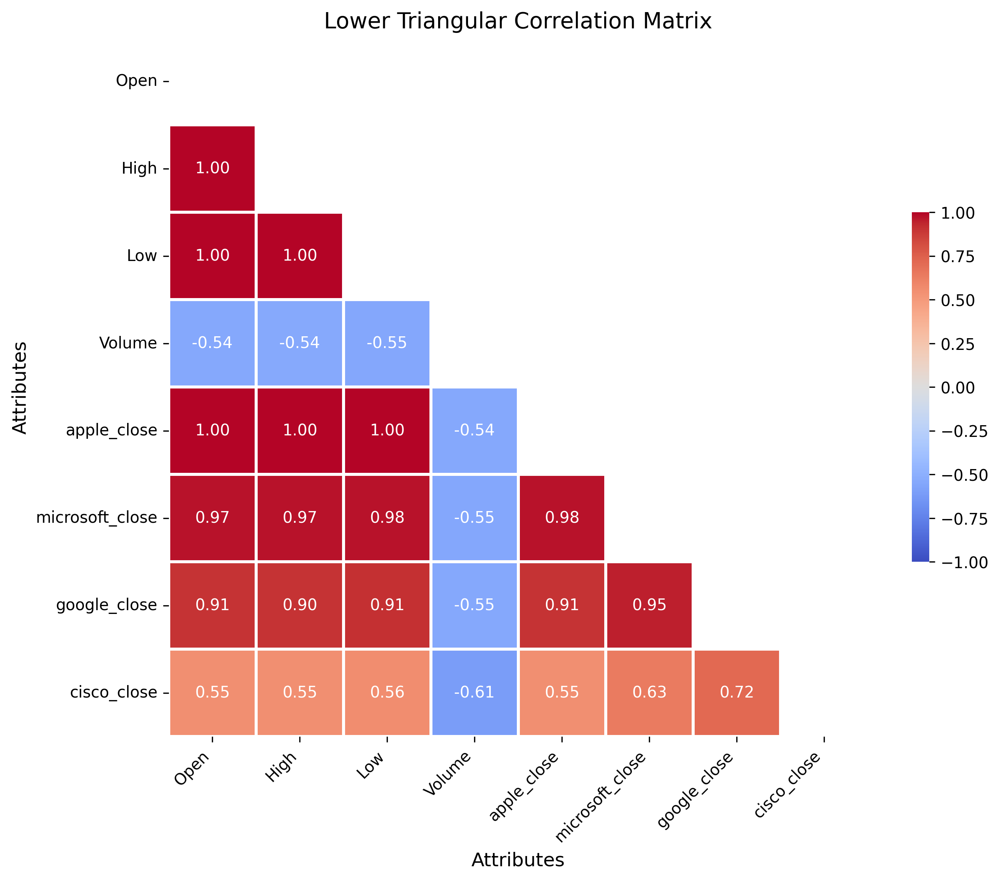

In [71]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Assuming apple_open, apple_high, apple_low, apple_volume, and closing_prices are defined DataFrames

# Concatenate apple data with closing_prices
explain_apple_close = pd.concat([apple_open, apple_high, apple_low, apple_volume, closing_prices], axis=1)

# Calculate the correlation matrix
correlation_matrix = explain_apple_close.corr()

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Draw the heatmap with the mask
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap='coolwarm', vmax=1, vmin=-1,
            square=True, linewidths=1.5, cbar_kws={"shrink": .5}, fmt=".2f")

# Rotate the x-axis and y-axis labels for readability
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)

# Add titles and labels
plt.title("Lower Triangular Correlation Matrix", fontsize=14)
plt.xlabel("Attributes", fontsize=12)
plt.ylabel("Attributes", fontsize=12)

plt.show()


In [72]:
print(explain_apple_close.columns)

Index(['Open', 'High', 'Low', 'Volume', 'apple_close', 'microsoft_close',
       'google_close', 'cisco_close'],
      dtype='object')


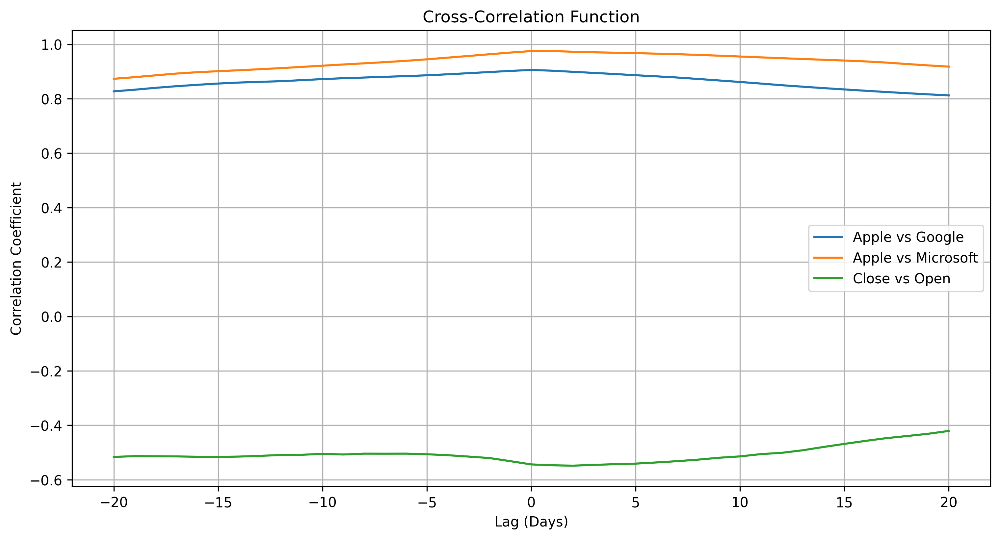

In [73]:
# Sample DataFrame
# closing_prices = pd.DataFrame({
#     'apple_close': [...],  # Replace with actual data
#     'google_close': [...],  # Replace with actual data
#     'microsoft_close': [...]  # Replace with actual data
# })

# Function to compute cross-correlation
def cross_correlation(series1, series2, lag):
    return series1.corr(series2.shift(lag))

# Define the range of lags (e.g., -20 days to 20 days)
lags = range(-20, 21)

# Compute cross-correlation for each lag for Apple vs. Google
cc_apple_google = [cross_correlation(explain_apple_close['apple_close'], explain_apple_close['google_close'], lag) for lag in lags]

# Compute cross-correlation for each lag for Apple vs. Microsoft
cc_apple_microsoft = [cross_correlation(explain_apple_close['apple_close'], explain_apple_close['microsoft_close'], lag) for lag in lags]

# Compute cross-correlation for each lag for close vs. open
cc_close_volume = [cross_correlation(explain_apple_close['apple_close'],explain_apple_close['Volume'], lag) for lag in lags]

# Plotting
plt.figure(figsize=(12, 6))

plt.plot(lags, cc_apple_google, label='Apple vs Google')
plt.plot(lags, cc_apple_microsoft, label='Apple vs Microsoft')
plt.plot(lags, cc_close_volume, label='Close vs Open')


plt.title('Cross-Correlation Function')
plt.xlabel('Lag (Days)')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True)
plt.show()


Les résultats présentés semblent être les coefficients de corrélation croisée pour différentes valeurs de décalage (lags) entre deux paires de séries temporelles. Ces résultats montrent comment la corrélation entre les séries évolue en fonction du décalage temporel. Voici comment interpréter ces résultats en français :

    Valeurs de Corrélation Élevées : Les coefficients de corrélation proches de 1 indiquent une forte corrélation positive. Cela signifie que lorsque les prix de clôture d'une action augmentent, les prix de clôture de l'autre action ont également tendance à augmenter.

    Interprétation des Lags :
        Si les valeurs de corrélation les plus élevées se trouvent à des lags positifs, cela suggère que les mouvements d'une action peuvent être un indicateur avancé pour l'autre action. Par exemple, si la corrélation la plus élevée est à un lag de +5 jours, cela pourrait indiquer que les variations de la première série temporelle précèdent celles de la deuxième de 5 jours.
        Si les valeurs les plus élevées se trouvent à des lags négatifs, cela suggère l'inverse - que la deuxième série temporelle pourrait être un indicateur avancé pour la première.

    Signification Statistique : Il est important de noter que même si une corrélation est élevée, cela ne signifie pas nécessairement qu'il existe une relation de causalité. D'autres analyses, telles que des tests de causalité de Granger, peuvent être nécessaires pour explorer davantage cette relation.

    Implications Pratiques : Une forte corrélation, en particulier à des lags spécifiques, peut être utilisée pour la prévision ou pour élaborer des stratégies de trading. Par exemple, si l'on sait qu'une action a tendance à suivre une autre avec un certain décalage, cela pourrait être utilisé pour anticiper les mouvements de prix.

En résumé, ces résultats fournissent des informations précieuses sur la manière dont les prix de clôture de ces actions sont interconnectés au fil du temps. Cela peut être particulièrement utile dans des domaines tels que l'analyse financière, la prévision boursière et la gestion de portefeuille.

In [75]:
# conclusion : forte correlation avec un lag = 20 

In [76]:
# Example usage
brand_name = ['google', 'microsoft', 'apple']
column_name = ['Close', 'Volume']
google_close = isolate_column(data, brand_name[0], column_name[0])
microsoft_close = isolate_column(data, brand_name[1], column_name[0])
trading_volume = isolate_column(data, brand_name[2], column_name[1])

C:\Users\AX2B\AppData\Local\Temp\ipykernel_18756\3782093789.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_df['Date'] = pd.to_datetime(selected_df['Date'].str.split(" ").str[0])
C:\Users\AX2B\AppData\Local\Temp\ipykernel_18756\3782093789.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_df.sort_values('Date', inplace=True)
C:\Users\AX2B\AppData\Local\Temp\ipykernel_18756\3782093789.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

S

In [77]:
print("google ADF-Test")
perform_adf_test(google_close, 'Close')
print("microsoft ADF-Test")
perform_adf_test(microsoft_close, 'Close')
print("Apple trading Volume ADF-Test")
perform_adf_test(trading_volume, 'Volume')


google ADF-Test
Test Statistic                  -0.792211
p_value                          0.821399
#Lags Used                       1.000000
Number of Observations Used    258.000000
Critical Value (1%)             -3.455953
Critical Value (5%)             -2.872809
Critical Value (10%)            -2.572775
dtype: float64

===> The time series is not stationary.
microsoft ADF-Test
Test Statistic                  -0.833539
p_value                          0.809071
#Lags Used                       1.000000
Number of Observations Used    258.000000
Critical Value (1%)             -3.455953
Critical Value (5%)             -2.872809
Critical Value (10%)            -2.572775
dtype: float64

===> The time series is not stationary.
Apple trading Volume ADF-Test
Test Statistic                  -2.387410
p_value                          0.145321
#Lags Used                      13.000000
Number of Observations Used    246.000000
Critical Value (1%)             -3.457215
Critical Value (5%)      

In [91]:
# Apply differentiation
google_diff = google_close['Close'].diff().dropna()
microsoft_diff = microsoft_close['Close'].diff().dropna()
volume_diff = trading_volume['Volume'].diff().dropna()

In [92]:
print(microsoft_diff.isna().sum())  # Vérifiez les valeurs NaN
print(microsoft_diff.isin([np.inf, -np.inf]).sum())  # Vérifiez les valeurs infinies

0
0


In [93]:
# Perform ADF test on the differentiated data
print("google ADF-Test aprés diff")
perform_adf_test(pd.DataFrame(google_diff), google_diff.name)
print("microsoft ADF-Test aprés diff")
perform_adf_test(pd.DataFrame(microsoft_diff), microsoft_diff.name)
print("volume ADF-Test aprés diff")
perform_adf_test(pd.DataFrame(volume_diff), volume_diff.name)

google ADF-Test aprés diff
Test Statistic                -1.349225e+01
p_value                        3.089910e-25
#Lags Used                     0.000000e+00
Number of Observations Used    2.580000e+02
Critical Value (1%)           -3.455953e+00
Critical Value (5%)           -2.872809e+00
Critical Value (10%)          -2.572775e+00
dtype: float64

===> The time series is stationary.
microsoft ADF-Test aprés diff
Test Statistic                -1.359755e+01
p_value                        1.981652e-25
#Lags Used                     0.000000e+00
Number of Observations Used    2.580000e+02
Critical Value (1%)           -3.455953e+00
Critical Value (5%)           -2.872809e+00
Critical Value (10%)          -2.572775e+00
dtype: float64

===> The time series is stationary.
volume ADF-Test aprés diff
Test Statistic                -6.055915e+00
p_value                        1.245326e-07
#Lags Used                     1.600000e+01
Number of Observations Used    2.420000e+02
Critical Value (1%) 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


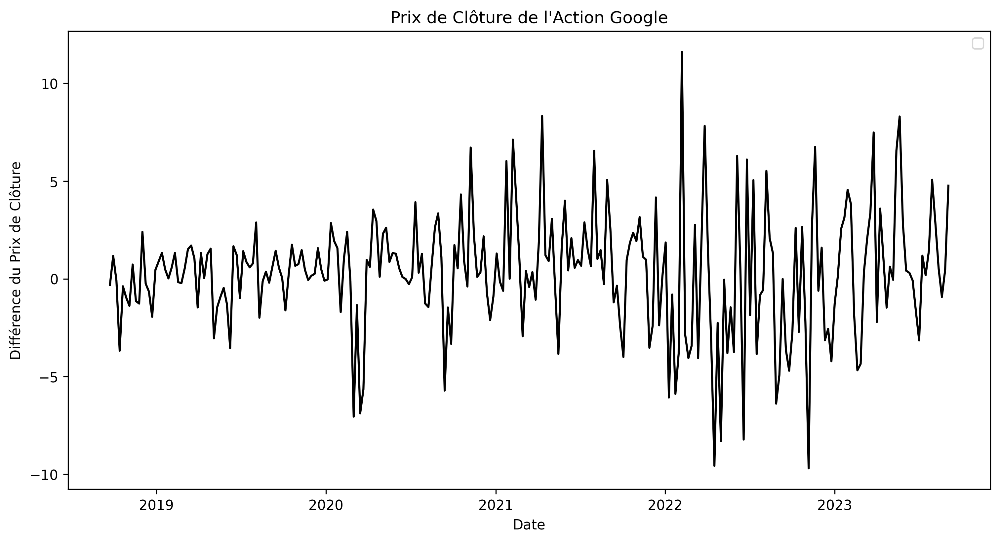

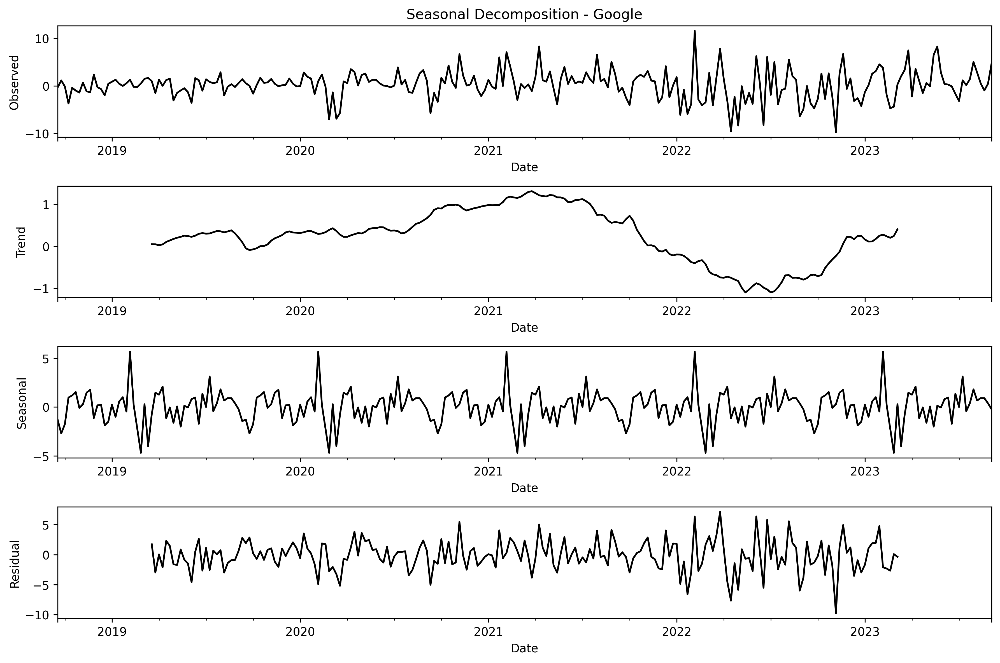

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


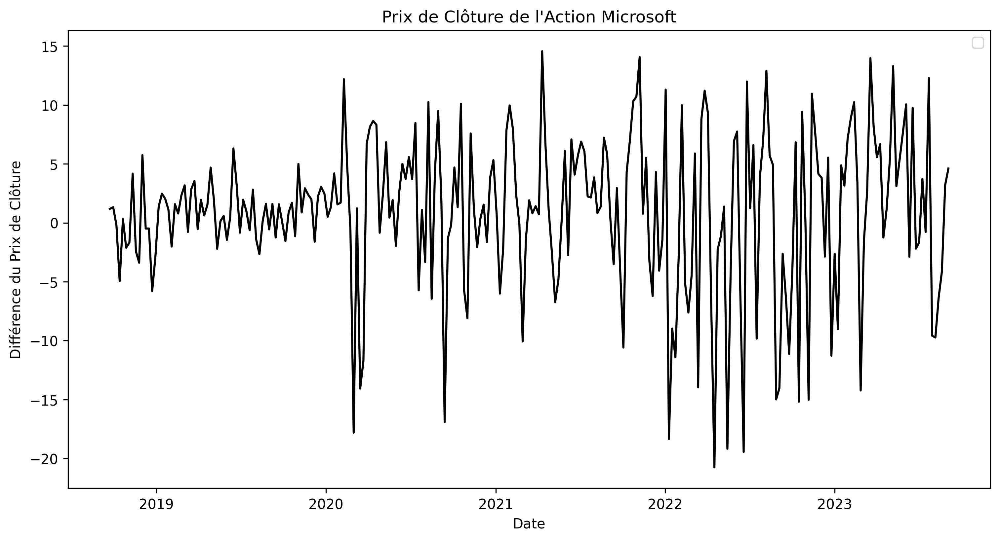

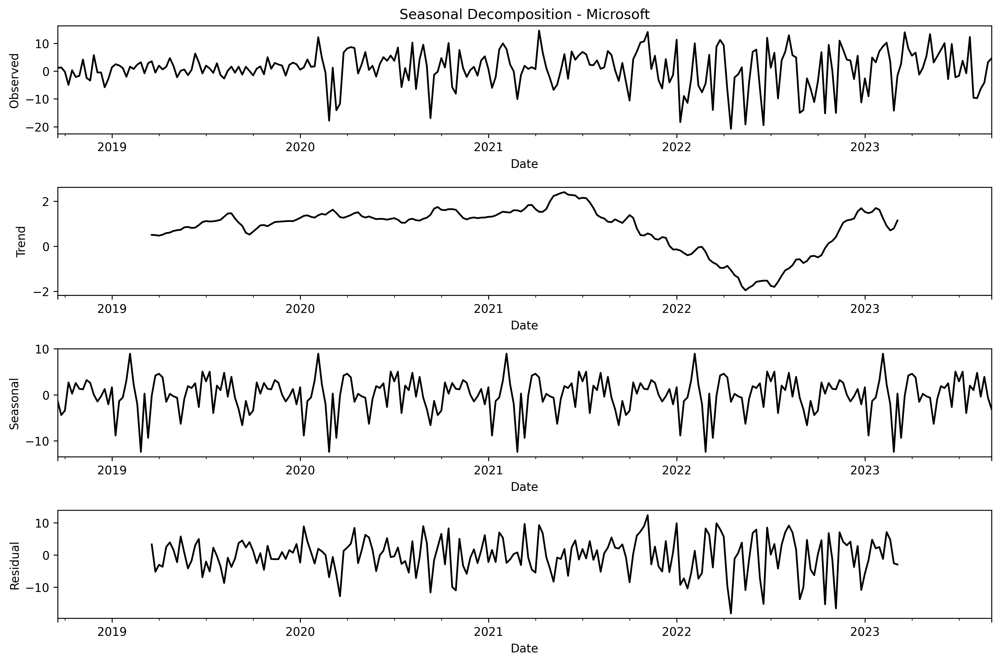

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


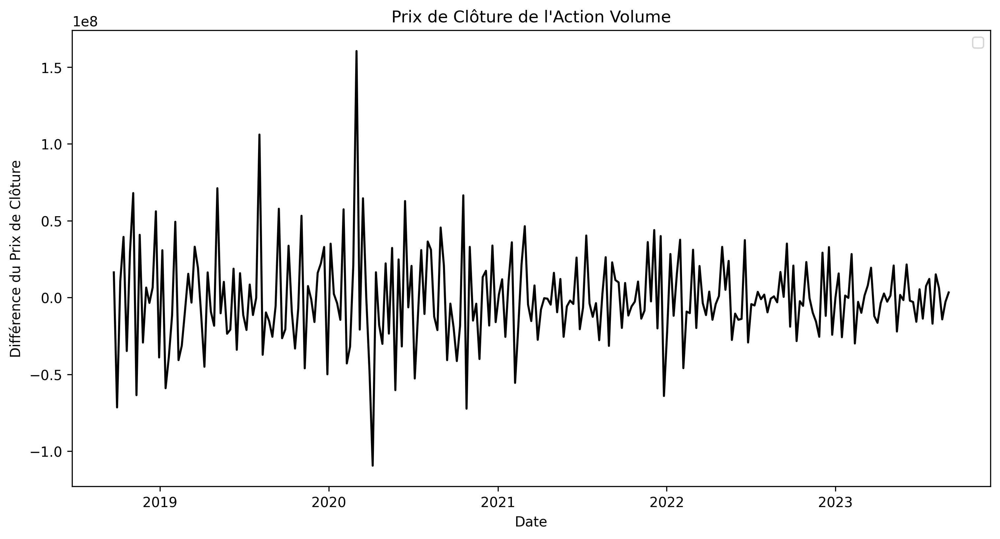

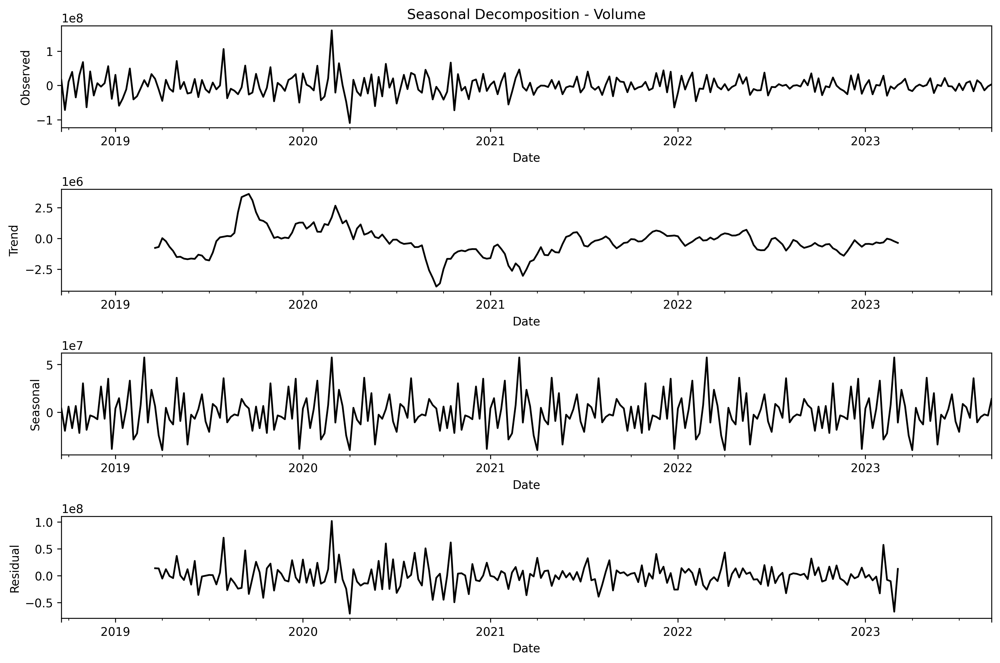

In [94]:
# google_diff and microsoft_diff are  DataFrame objects
dataframes = {
    'Google': google_diff,
    'Microsoft': microsoft_diff,
    'Volume': volume_diff
}

for name, diff in dataframes.items():
    # Plotting the differentiated data
    plt.figure(figsize=(12, 6), dpi=300)
    plt.plot(diff, color='black')
    plt.title(f"Prix de Clôture de l'Action {name}")
    plt.xlabel('Date')
    plt.ylabel('Différence du Prix de Clôture')
    plt.legend()
    plt.show()
    
    # Seasonal decomposition of the differentiated data
    decomposition_diff = sm.tsa.seasonal_decompose(diff, model='additive')
    
    # Get the decomposition plot
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 8))
    
    # Plotting each component
    decomposition_diff.observed.plot(ax=ax1, color='black')
    ax1.set_ylabel('Observed', color='black')
    ax1.set_title(f'Seasonal Decomposition - {name}')
    
    decomposition_diff.trend.plot(ax=ax2, color='black')
    ax2.set_ylabel('Trend', color='black')
    
    decomposition_diff.seasonal.plot(ax=ax3, color='black')
    ax3.set_ylabel('Seasonal', color='black')
    
    decomposition_diff.resid.plot(ax=ax4, color='black')
    ax4.set_ylabel('Residual', color='black')
    
    # Adjusting layout for better display
    plt.tight_layout()
    plt.show()


In [95]:
g_train_df, g_test_df, n_test = split_time_series(google_diff, 'Close', 0.05)
g_train_df.head()

Date
2018-09-23   -0.318700
2018-09-30    1.170500
2018-10-07   -0.093501
2018-10-14   -3.680699
2018-10-21   -0.383300
Freq: W-SUN, Name: Close, dtype: float64

In [96]:
m_train_df, m_test_df, n_test = split_time_series(microsoft_diff, 'Close', 0.05)
m_train_df.head()

Date
2018-09-23    1.188074
2018-09-30    1.326411
2018-10-07   -0.195175
2018-10-14   -4.945583
2018-10-21    0.325911
Freq: W-SUN, Name: Close, dtype: float64

In [97]:
v_train_df, v_test_df, v_test = split_time_series(volume_diff, 'Volume', 0.05)
m_train_df.head()

Date
2018-09-23    1.188074
2018-09-30    1.326411
2018-10-07   -0.195175
2018-10-14   -4.945583
2018-10-21    0.325911
Freq: W-SUN, Name: Close, dtype: float64

In [98]:
# Vérifier si des valeurs sont manquantes ou infinies
X = pd.concat([g_train_df, m_train_df,v_train_df], axis=1)
print(X.isna().sum())
print(X.isin([np.inf, -np.inf]).sum())

Close     0
Close     0
Volume    0
dtype: int64
Close     0
Close     0
Volume    0
dtype: int64


In [99]:
import statsmodels.api as sm
import pandas as pd

# Assuming 'train_df', 'g_train_df', 'm_train_df' are Pandas Series

# Set the target variable (Apple's closing price)
y = train_df  # This is your target series

# Combine the exogenous variables (Google's and Microsoft's closing prices) into a DataFrame
X = pd.concat([g_train_df, m_train_df,v_train_df], axis=1)

# Give meaningful column names to X
X.columns = ['google_close', 'microsoft_close','trading_volume']


                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                  247
Model:               SARIMAX(3, 0, 2)   Log Likelihood                -570.802
Date:                Tue, 12 Dec 2023   AIC                           1159.603
Time:                        01:58:57   BIC                           1191.188
Sample:                    09-23-2018   HQIC                          1172.319
                         - 06-11-2023                                         
Covariance Type:                  opg                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
google_close        0.3039      0.064      4.783      0.000       0.179       0.429
microsoft_close     0.3372      0.028     12.015      0.000       0.282       0.392
trading_volume   1.383e-08   6.2

C:\Users\AX2B\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [1]:
import statsmodels.api as sm
import itertools
import pandas as pd
import warnings

warnings.filterwarnings("ignore")  # Ignore convergence warnings

# Define the range for ARIMA parameters
p = d = q = range(0, 3)
pdq = list(itertools.product(p, d, q))

# Assuming non-seasonal model
best_aic = float('inf')
best_params = None

for param in pdq:
    try:
        model = sm.tsa.SARIMAX(y, exog=X, order=param)
        results = model.fit()

        if results.aic < best_aic:
            best_aic = results.aic
            best_params = param
    except:
        continue

print("Best ARIMA parameters:", best_params, "Best AIC:", best_aic)


In [ ]:
# Define the order of the model (example values used here)
order = (3, 0, 2)  # Replace with appropriate values

# Fit the SARIMAX model
model = sm.tsa.SARIMAX(y, exog=X, order=order, seasonal_order=(0, 0, 0, 0))
results = model.fit()

# Print the summary of the model
print(results.summary())

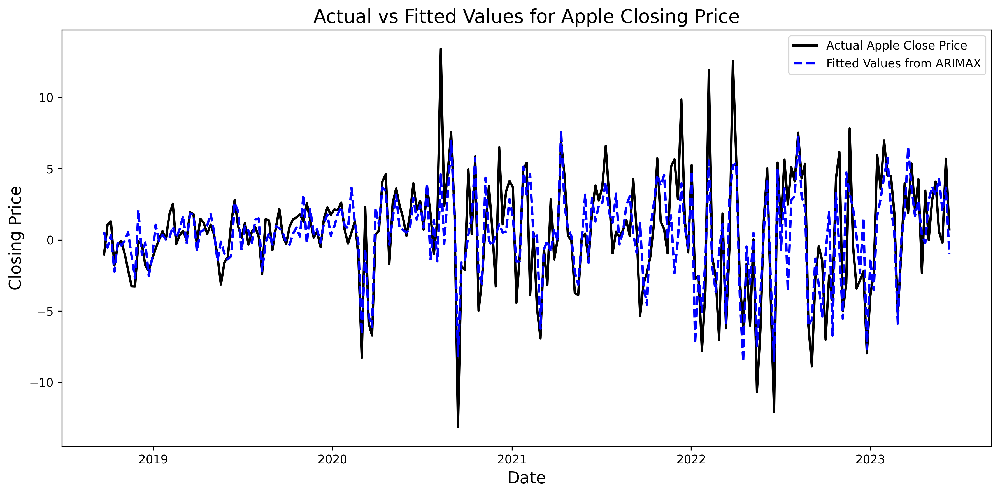

<Figure size 3600x2400 with 0 Axes>

In [103]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming the above code for fitting the model is already executed

# Extract the fitted values
fitted_values = results.fittedvalues

# Create a high-resolution plot
plt.figure(figsize=(12, 6), dpi=300)

# Plotting the actual and fitted values
plt.plot(y, label='Actual Apple Close Price', color='black', linewidth=2)
plt.plot(fitted_values, label='Fitted Values from ARIMAX', color='blue', linestyle='--', linewidth=2)

# Adding titles and labels
plt.title('Actual vs Fitted Values for Apple Closing Price', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Closing Price', fontsize=14)

# Add legend
plt.legend()

# Enhance layout
plt.tight_layout()

# Show the plot
plt.show()

# Optionally, save the plot as a high-quality PNG file
plt.savefig('arimax_fitted_values.png', format='png', dpi=300)


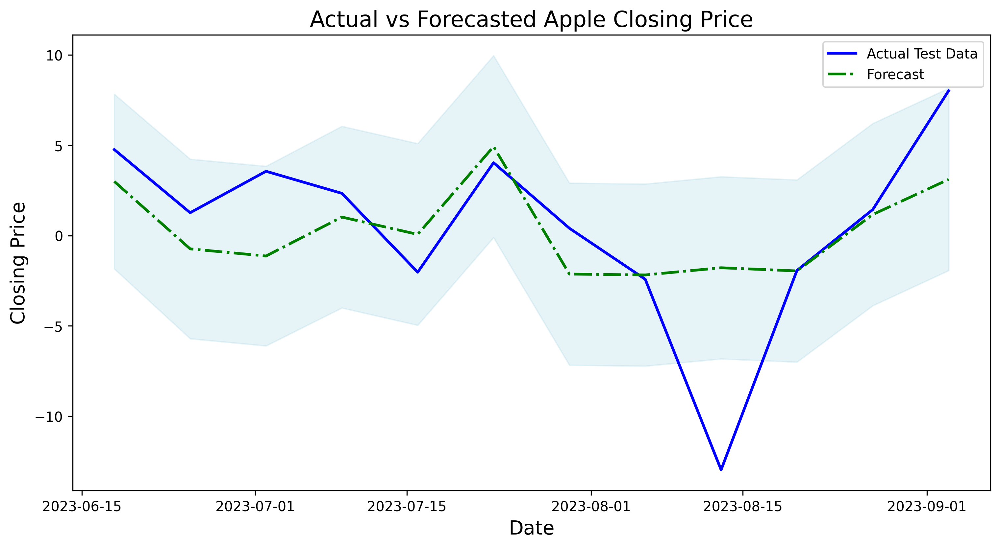

<Figure size 3600x2400 with 0 Axes>

In [104]:
# Preparing future exogenous variables
# Assuming g_forecast and m_forecast are your future exogenous variables
X_future = pd.concat([g_test_df, m_test_df, v_test_df], axis=1)
X_future.columns = ['google_close', 'microsoft_close', 'trading_volume']

# Forecasting future values
forecast = results.get_forecast(steps=n_test, exog=X_future)
forecast_values = forecast.predicted_mean
forecast_conf_int = forecast.conf_int()

# Creating a time index for the forecasted period
# Assuming test_df's index is aligned with the forecast period
forecast_index = test_df.index

# Plotting the results
plt.figure(figsize=(12, 6), dpi=300)

# Plot actual test data
plt.plot(test_df, label='Actual Test Data', color='blue', linestyle='-', linewidth=2)

# Plot forecasts
plt.plot(forecast_index, forecast_values, label='Forecast', color='green', linestyle='-.', linewidth=2)

# Plot confidence intervals
plt.fill_between(forecast_index, forecast_conf_int.iloc[:, 0], forecast_conf_int.iloc[:, 1], color='lightblue', alpha=0.3)

# Adding titles and labels
plt.title('Actual vs Forecasted Apple Closing Price', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Closing Price', fontsize=14)
plt.legend()

# Show the plot
plt.show()

# Optionally, save the plot
plt.savefig('apple_test_vs_forecast.png', format='png', dpi=300)

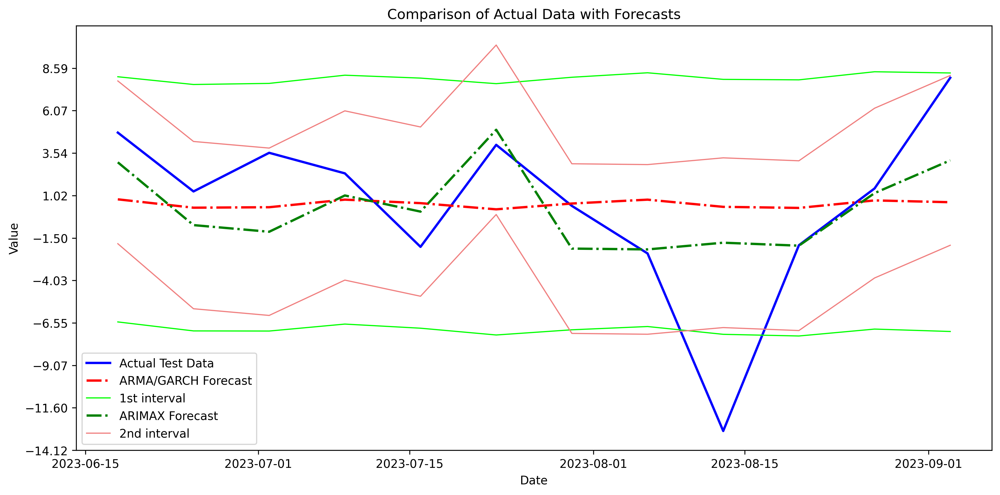

<Figure size 3600x2400 with 0 Axes>

In [109]:
import matplotlib.pyplot as plt
import numpy as np

# Assurez-vous que toutes les données nécessaires sont définies

# Créer une figure
plt.figure(figsize=(12, 6), dpi=300)

# Tracer les données de test réelles
plt.plot(test_df, label='Actual Test Data', color='blue', linestyle='-', linewidth=2)

# Tracer les prévisions ARMA/GARCH
plt.plot(forecast_df['Forecast'], color='red', label='ARMA/GARCH Forecast', linestyle='-.', linewidth=2)
plt.plot(forecast_df.index, forecast_df['Lower Bound'], color='lime', linestyle='-', linewidth=1, label='1st interval')
plt.plot(forecast_df.index, forecast_df['Upper Bound'], color='lime', linestyle='-', linewidth=1)

# Tracer les prévisions supplémentaires
plt.plot(forecast_index, forecast_values, label='ARIMAX Forecast', color='green', linestyle='-.', linewidth=2)
plt.plot(forecast_index, forecast_conf_int.iloc[:, 0], color='lightcoral', linestyle='-', linewidth=1, label='2nd interval')
plt.plot(forecast_index, forecast_conf_int.iloc[:, 1], color='lightcoral', linestyle='-', linewidth=1)

# Ajouter les titres et labels
plt.title('Comparison of Actual Data with Forecasts')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()

# Ajuster les intervalles des ticks de l'axe y si nécessaire
y_min, y_max = plt.ylim()
new_ticks = np.arange(y_min, y_max, (y_max - y_min) / 10)  # Ajustez si nécessaire
plt.yticks(new_ticks)

# Afficher la figure
plt.tight_layout()  # Ajuste automatiquement les sous-graphiques pour qu'ils s'adaptent à la figure
plt.show()

# Enregistrer la figure
plt.savefig('combined_forecasts_plot.png', format='png', dpi=300)
